### Τεχνικές Εξόρυξης Δεδομένων - 1η Άσκηση


---



*   Iωάννης Καπετανγεώργης | 1115201800061
*   Δημήτριος Σιταράς | 1115201800178

---







In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!unzip -qq /content/gdrive/MyDrive/TeDe\ Project1/ask1.zip

In [ ]:
# !unzip -qq /content/gdrive/MyDrive/TEDE/ask1.zip

In [ ]:
import pandas as pd
import sys
import matplotlib.pyplot as plt
%matplotlib inline 

### Μέρος 1ο 

---





In [ ]:
Location = r'netflix_titles.csv'
df = pd.read_csv(Location)

Αρχικά, φορτώνουμε το αρχείο netflix_titles.csv σε ένα data frame και στην συνέχεια βάζουμε σε οποιες εγγραφές έχουν κενή (NULL) την στήλη "director" την συμβολοσειρά: 'Unknown Director'. Οι υπόλοιπες εγγραφες που έχουν οποιαδήποτε άλλη κενή στήλη αφαιρούνται απο το dataframe (παρατηρήσαμε οτι οι μόνες στήλες που σε καποιες εγγραφές ειναι κενές είναι η ***director*** και η ***cast***)

In [ ]:
df['director'] = df['director'].fillna('Unknown Director')
df = df.dropna()

## **Ερώτημα 1**


---


Μέσω της μεθόδου value_counts στο dataframe, που δημιουργήθηκε παραπάνω, βρίσκουμε των συνολικό αριθμό των ταινιών και των σειρών. Επειτα, αποθηκεύουμε αυτές τις μετρήσεις σε ένα καινούριο dataframe (ώστε να εκτυπώσουμε το γράφημα που φαίνεται στην συνέχεια) με columns τις type και Count. Τέλος, βρίσκουμε και εκτυπώνουμε ποιο είδος υπερτερεί.


There are more: Movies


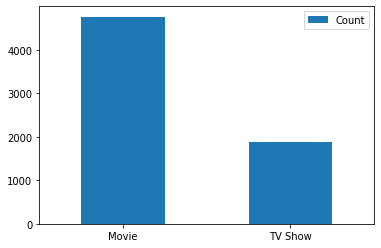

In [ ]:
#erwtima 1
res = df.value_counts('type') # count the movies and the TV Shows
newDf = res.to_frame(name='Count') # make the previous result database
newDf.reset_index(inplace = True,level='type') # formatting
MaxName = newDf['type'][newDf['Count'] == newDf['Count'].max()].values # find which has excellence, movies or TV Shows
newDf.plot.bar(x='type',rot=0); # print the corresponding bar chart
plt.xlabel('');
print("\nThere are more: "+MaxName[0]+"s")

## **Ερώτημα 2** 


---


Από το αρχίκο dataframe παίρνουμε όλες τις εγγραφές έχοντας όμως ως columns: type και date_added και τις εκχωρούμε σε ένα καινούριο dataframe. Στη συνέχεια, με την βοήθεια 2 dictionaries για τις ταινίες και τις σειρές αντίστοιχα υπολογίζουμε για κάθε χρονιά τον συνολικό αριθμό των Movies και των Tv Shows. Έτσι, δημιουργούμε 2 νέα dataframes με βάση αυτων των dictionaries, εκτυπώνοντας το αντίστοιχο γράφημα το οποίο παρουσιαζει συγκριτικά για κάθε χρονιά των αριθμό των ταινιών και των σειρών. Είναι φάνερό πως απο το γράφημα που παρουσιάζουμε πως τα τελευταία χρόνια το netflix επενδύει περισσότερο σε ταινίες.

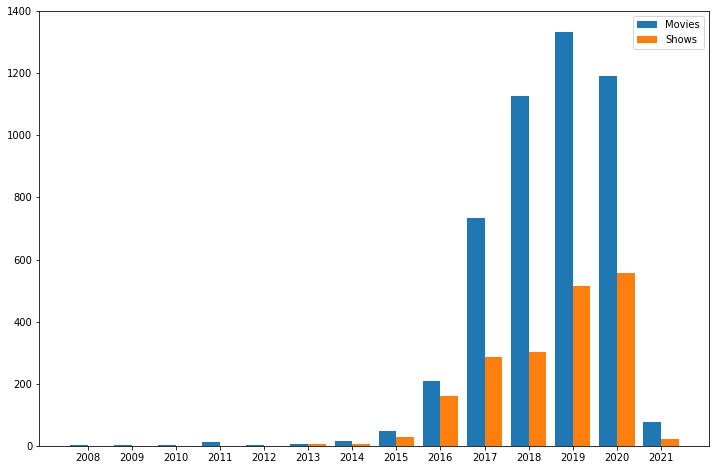

In [ ]:
#erwtima 2 
ques2=df[['type','date_added']] # at a new data frame keep only the columns "type" and "date_added"
ques2=ques2.values.tolist() # convert the dataframe to list
movies_per_year = {} # dictionary to count movies per year
shows_per_year = {} # dictionary to count TV shows per year
series=0
for q in ques2:
  year = q[1].split(", ") # split the sentence and take the year
  year = int(year[1])
  if year not in movies_per_year: # introduction and initialization if the year doesn't exist at dictionary
    movies_per_year[year] = 0
    shows_per_year[year] = 0
  if q[0]=="Movie": # find the category and just increase the corresponding number of a specific year
    movies_per_year[year] += 1
  else:
    shows_per_year[year] += 1
sorted_movies = {k: v for k, v in sorted(movies_per_year.items(), key=lambda item: item[0])} # make a sort for a better printing of the results
moviesDf = list(zip(list(sorted_movies.keys()),list(sorted_movies.values()))) # make a concatenate of the previous data to a single list
moviesDf = pd.DataFrame(moviesDf) # convert the list to dataframe, suitable for the bar plot
moviesDf.columns = ['Year','Count']

sorted_shows = {k: v for k, v in sorted(shows_per_year.items(), key=lambda item: item[0])} # make a sort for a better printing of the results
showsDf = list(zip(list(sorted_shows.keys()),list(sorted_shows.values()))) # make a concatenate of the previous data to a single list
showsDf = pd.DataFrame(showsDf) # convert the list to dataframe, suitable for the bar plot
showsDf.columns = ['Year','Count']


# bar plot 
# finnaly just printing the movies and the tv shows in a common bar plot 

import numpy as np

z = list(sorted_shows.keys())

fig, ax = plt.subplots(figsize=(12, 8))

bar_width = 0.4

x = np.asarray(range(1,len(list(sorted_shows.keys()))+1))

b1 = ax.bar(x, moviesDf['Count'],width=bar_width,label='Movies')
    
b2 = ax.bar(x + bar_width,showsDf['Count'],width=bar_width,label='Shows')

ax.set_xticks(x + bar_width / 2)
ax.set_xticklabels(z)
ax.legend();

## **Ερώτημα 3** 


---


Από το αρχίκο dataframe παίρνουμε όλες τις εγγραφές έχοντας όμως ως column μόνο το country και τις εκχωρούμε σε ένα καινούριο dataframe. Με την βοήθεια ενός dictionary υπολογίζουμε για κάθε χώρα πόσες σειρές ή ταινίες (το περιεχόμενό της) έχει συνολικά. Έτσι, δημιουργούμε ένα νέο dataframe με βάση του dictionary, εκτυπώνοντας το αντίστοιχο γράφημα το οποίο παρουσιάζει για κάθε χώρα το συνολικό αριθμό ταινιών και σειρών που έχει. Είναι φάνερό πως απο το γράφημα που παρουσιάζουμε πως η χώρα που έχει το περισσότερο περιεχόμενο είναι η ΗΠΑ.

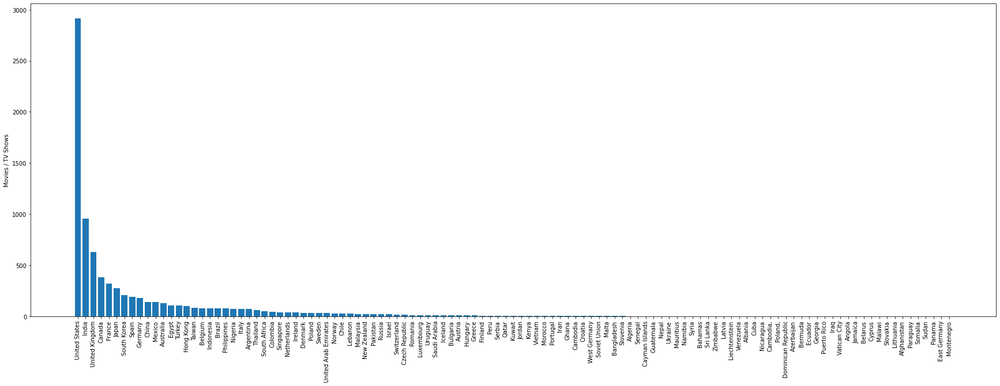


The country with the most content is : United States


In [ ]:
#erwtima 3
newDf3 = df[['country']] # at a new data frame keep only the column "country"
newDf3 = newDf3.values.tolist() # convert the dataframe to list
country_count = {} # dictionary to count how many movies or TV shows every country has
for x in newDf3:
  splitted_countries = x[0].split(", ") # split countries, a field may has multiple countries
  for country in splitted_countries:
    if country in country_count: # country exists, increase the corresponding counter
      country_count[country] += 1
    else: # country not exists, introduction and initialization 
      country_count[country] = 1

      
sorted_dict = {k: v for k, v in sorted(country_count.items(), key=lambda item: item[1],reverse=True)} # make a sort for a better printing of the results


#------------------------------------------------------------------------------
# just printing the corresponding bar plot
plt.figure(figsize=(30, 10))
plt.bar(range(len(sorted_dict)), sorted_dict.values(), align='center')
plt.xticks(range(len(sorted_dict)), sorted_dict.keys())
plt.xticks(rotation = 90)
plt.ylabel('Movies / TV Shows');
plt.show()

print("\nThe country with the most content is : " + list(sorted_dict.keys())[0])

## **Ερώτημα 4** 


---


Από το αρχίκο dataframe παίρνουμε όλες τις εγγραφές έχοντας όμως ως columns τα country, listed_in και και τις εκχωρούμε σε ένα καινούριο dataframe. Στη συνέχεια για να πετυχουμε το ζητούμενο έχουμε ενα dictionary οπου κάθε key του αντιπροσωπεύει μια χώρα και κάθε item του αποτελείται επίσης απο ένα dictionary οπου στα keys του έχουμε όλα τα είδη ταινιών-σειρών που έχει μια συγκεκριμένη χώρα και αντίστοιχα στα items την ποσότητα αυτών . Έτσι, καλώντας την συνάρτηση ***plotFun()*** εκτυπώνουμε μια σειρά απο γραφήματα pie plot για κάθε χώρα οπου ουσιαστικά φαίνονται τα ποσοστά των genres των ταινιών/σειρών που επικρατούν στην κάθε μια.

In [ ]:
# erwtitma 4 (function that prints the pie plots)
def plotFun(dictionary2, country):
  labels = []
  sizes = []
  sorted_by_persent = {k: v for k, v in sorted(dictionary2.items(), key=lambda item: item[1],reverse=True)} # make a sort for a better printing of the results
  for x, y in sorted_by_persent.items():
      labels.append(x)
      sizes.append(y)

  #------------------------------------------------------------------------------
  # Pie Plot

  fig1, ax1 = plt.subplots(figsize=(8, 5))
  fig1.subplots_adjust(0.3,0,1,1)


  theme = plt.get_cmap('terrain')
  ax1.set_prop_cycle("color", [theme(1. * i / len(sizes)) for i in range(len(sizes))])

  _, _ = ax1.pie(sizes, startangle=90)

  ax1.axis('equal')
  ax1.set_title(country,fontsize = 16, fontweight="bold")
  totalsum = sum(sizes) 
  # sort legend by percentage
  plt.legend(
      loc='upper left',
      labels=['%s, %1.1f%%' % (
          l, (float(s) / totalsum) * 100) for l, s in zip(labels, sizes)],
      prop={'size': 11},
      bbox_to_anchor=(0.0, 1),
      bbox_transform=fig1.transFigure
  )

  plt.show()

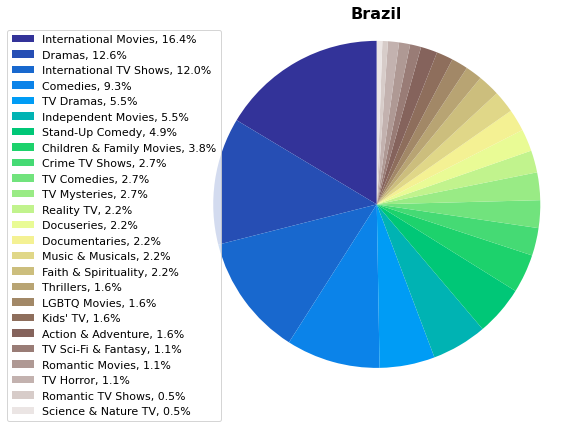

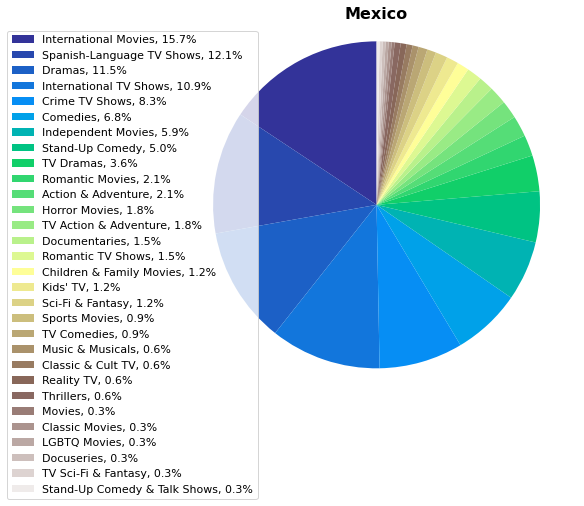

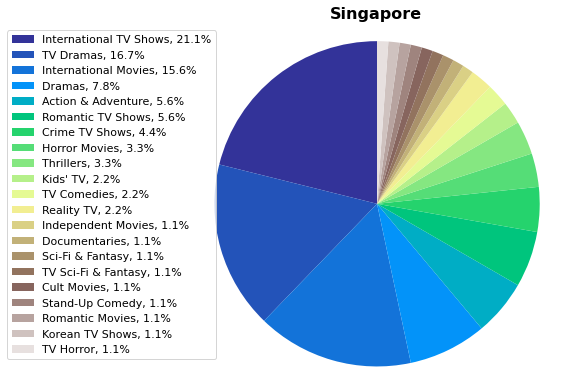

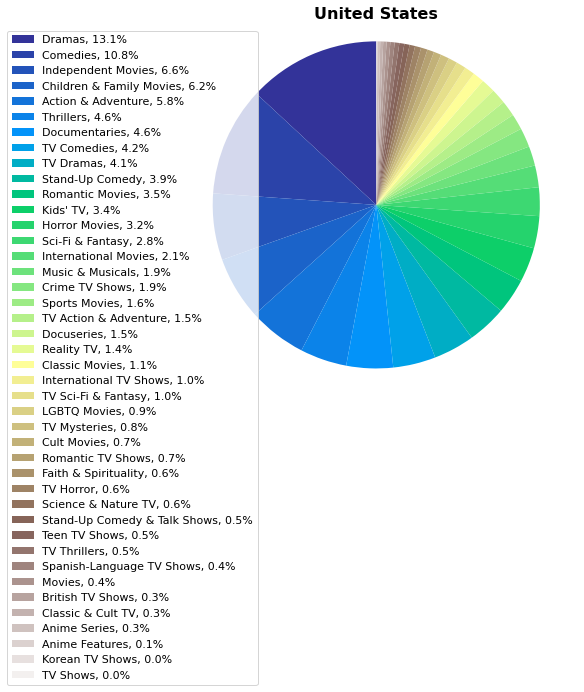

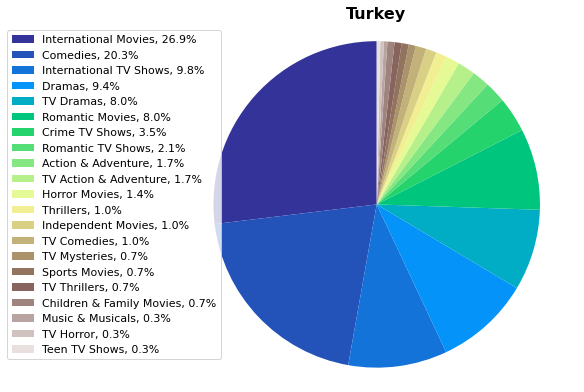

...

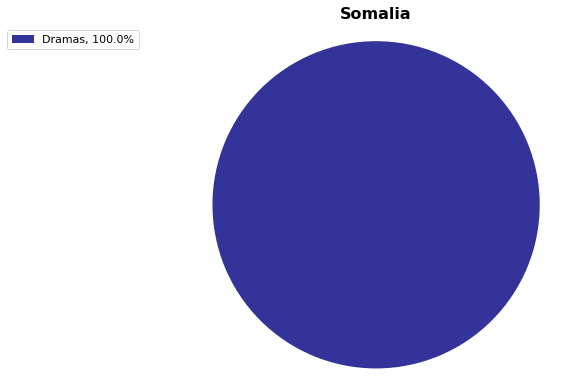

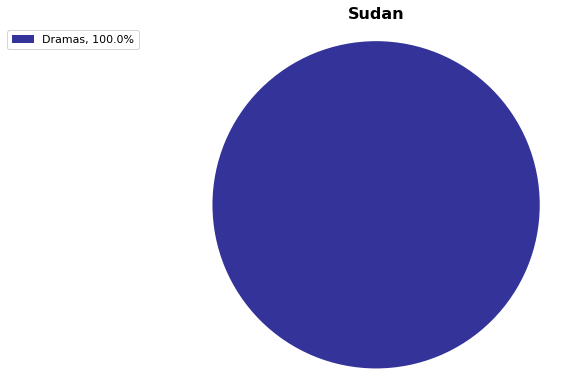

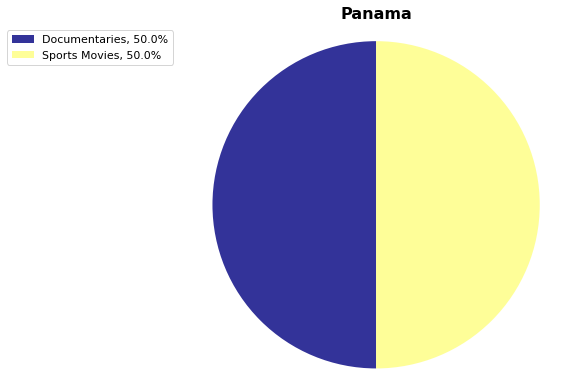

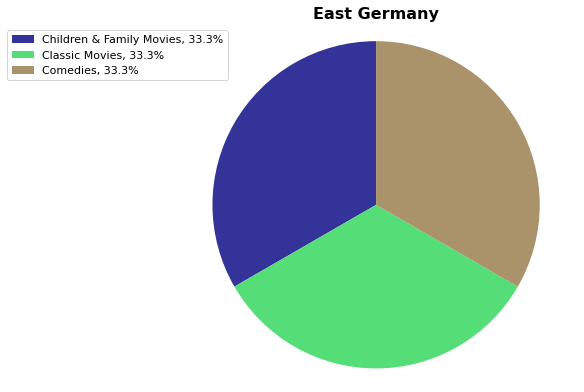

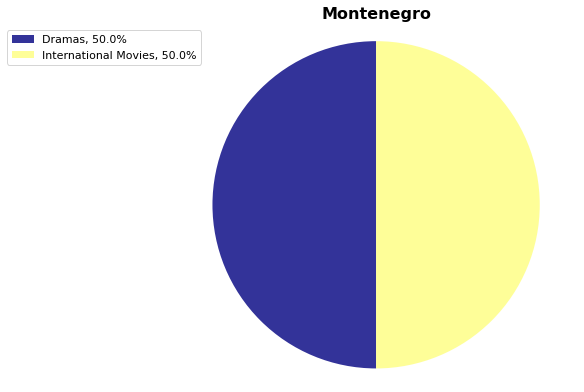

In [ ]:
#erwtima 4
temp = df[['country','listed_in']] # at a new data frame keep only the columns "country" and "listed_in"
temp = temp.values.tolist()
country_content = {} # dictionary to count the number of every category of content for every country
for x in temp:  # for every record
  splitted_countries = x[0].split(", ") # split countries
  splitted_listedin = x[1].split(", ")  # split kinds of movie (listed_in)
  for country in splitted_countries:  # for every country of the certain movie
    if country not in country_content:  # if country does not exist in the country dictionary, add it 
      country_content[country]= { }
    for list_in in splitted_listedin: # for every genre of this record
      if list_in in country_content[country]:
        country_content[country][list_in] += 1
      else:
        country_content[country][list_in]=1
        
# add pie plot for every country
for country,d in country_content.items():
  plotFun(d,country)
  


## **Ερώτημα 5** 


---


Από το αρχίκο dataframe παίρνουμε όλες τις εγγραφές που αφορούν τις ταινίες (type==Movie) με columns τα country, cast και τις εκχωρούμε σε ένα καινούριο dataframe. Στη συνέχεια για να πετυχουμε το ζητούμενο έχουμε ενα dictionary οπου κάθε key του αντιπροσωπεύει μια χώρα και κάθε item του αποτελείται επίσης απο ένα dictionary οπου στα keys του έχουμε όλους τους ηθοποιούς που έχουν "παίξει" σε ταίνια στην συγκεκριμένη χώρα και στα items τον αντίστοιχο αριθμό γυρισμάτων τους. Έτσι, εκτυπώνουμε μια σειρά απο ραβδοειδής γραφήματα για κάθε χώρα οπου ουσιαστικά δείχνουν τους ηθοποιούς και των αριθμό των γυρισμάτων τους στις χώρες αυτες. Στο κάθε γράφημα φαίνονται οι 10 ηθοποιοί με τα περισσότερα γυρίσματα στην αντίστοιχη χώρα και ο αριθμός των γυρισμάτων του καθενός.


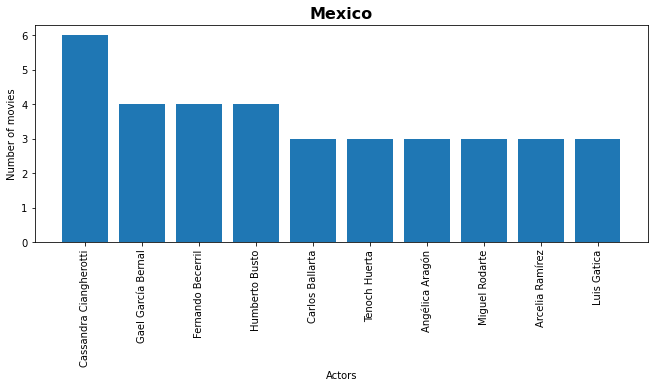

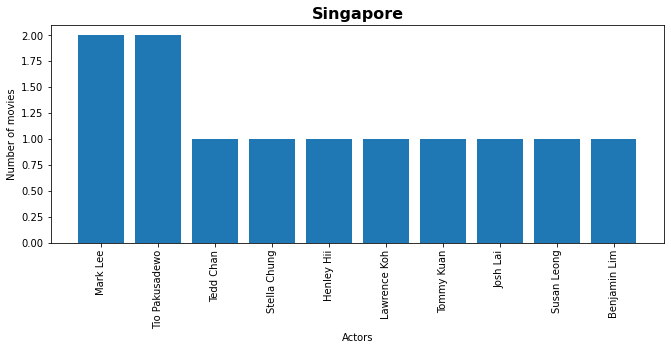

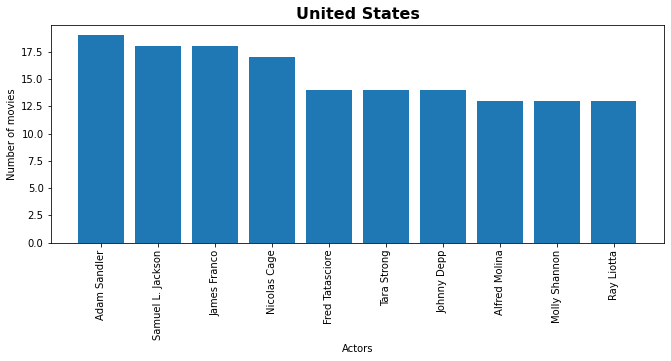

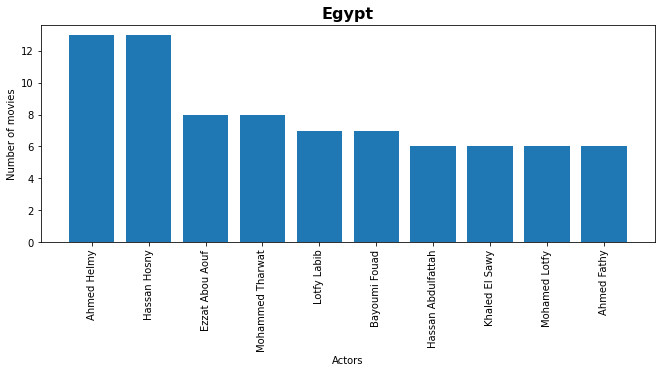

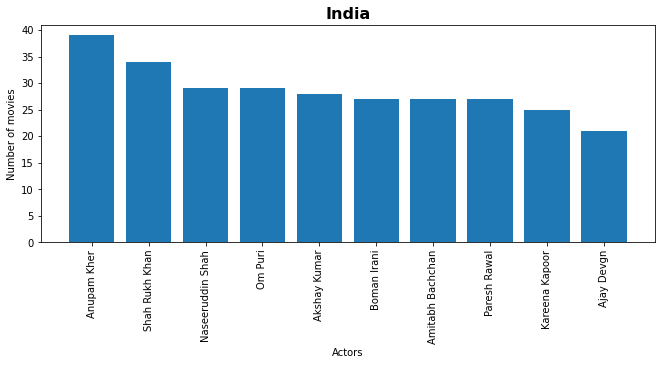

...

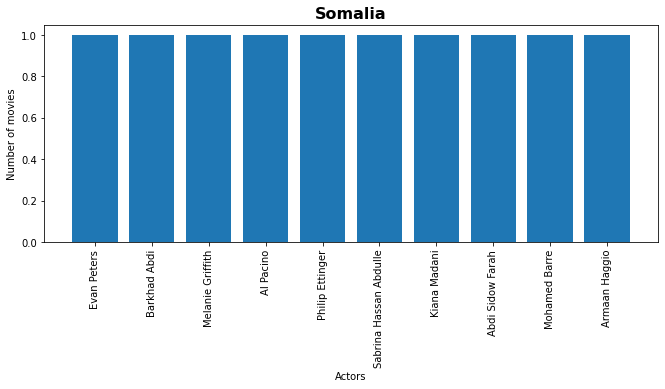

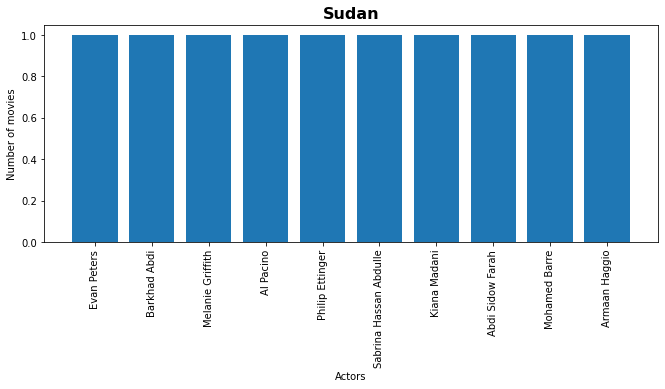

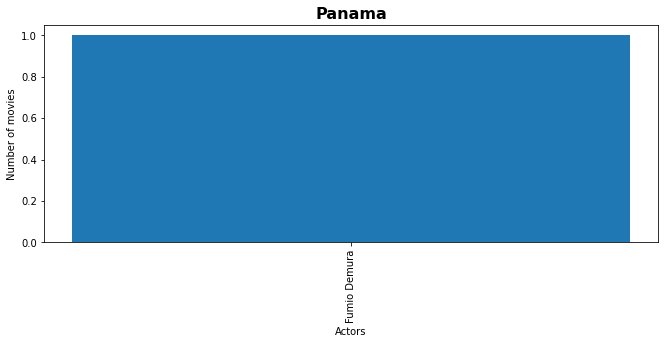

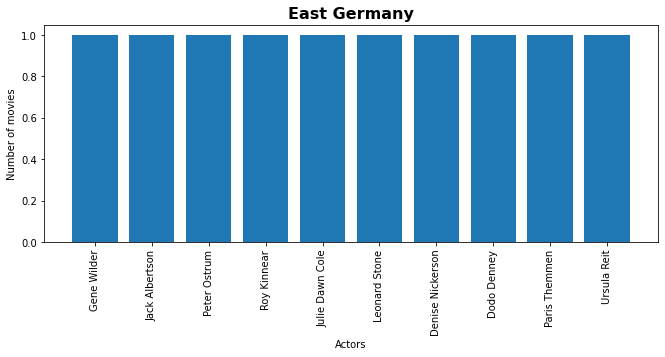

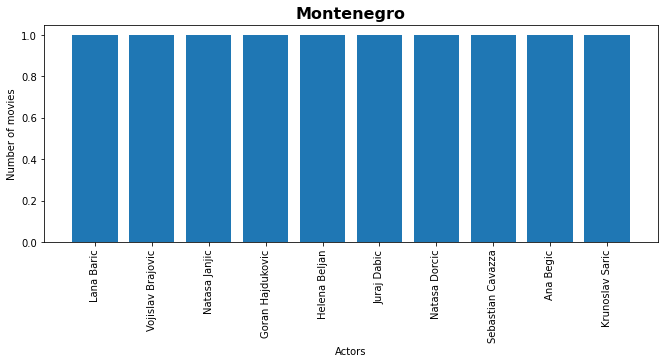

In [ ]:
#erwtima 5 - Movies 
import itertools 
tempDf = df[df['type']=="Movie"] # keep only movie-related recordings
tempDf = tempDf[['country','cast']] # at a new data frame keep only the columns "country" and "cast"
tempDf = tempDf.values.tolist() # convert the data frame to list
country_actors = {} # dictionary to count the number of movies that every actor have been play for each country
for x in tempDf:  # for every record
  splitted_countries = x[0].split(", ") # split countries
  splitted_actors = x[1].split(", ")  # split kinds of movie (listed_in)
  for country in splitted_countries:  # for every country of the certain movie
    if country not in country_actors:  # if country does not exist in the country dictionary, add it 
      country_actors[country]= { }
    for actor in splitted_actors: # for every genre of this record
      if actor in country_actors[country]:
        country_actors[country][actor] += 1
      else:
        country_actors[country][actor] = 1

#------------------------------------------------------------------------------

# bar plot for every country
for country in country_actors.keys():
  country_actors[country] = {k: v for k, v in sorted(country_actors[country].items(), key=lambda item: item[1],reverse=True)} # make a sort for a better printing of the results
  country_actors[country] = dict(itertools.islice(country_actors[country].items(), 10))

for country in country_actors.keys():
  temp_dict = country_actors[country]
  plt.figure(figsize=(11, 4))
  plt.bar(range(len(temp_dict)), temp_dict.values(), align='center')
  plt.xticks(range(len(temp_dict)), temp_dict.keys())
  plt.xticks(rotation = 90)
  plt.title(country,fontsize = 16, fontweight="bold")
  plt.ylabel('Number of movies');
  plt.xlabel('Actors');
  plt.show()



Παρακάτω κάνουμε το αντίστοιχο για τις σειρές (TV Shows).

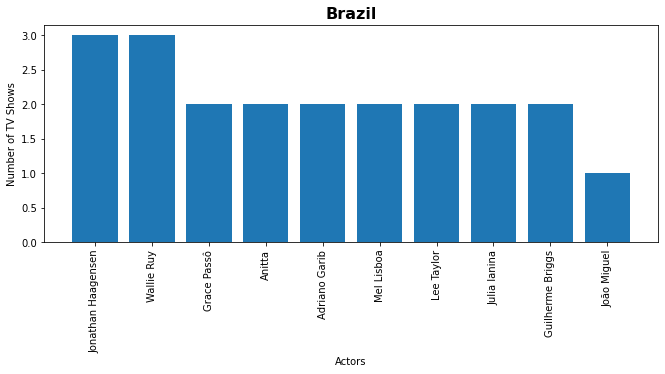

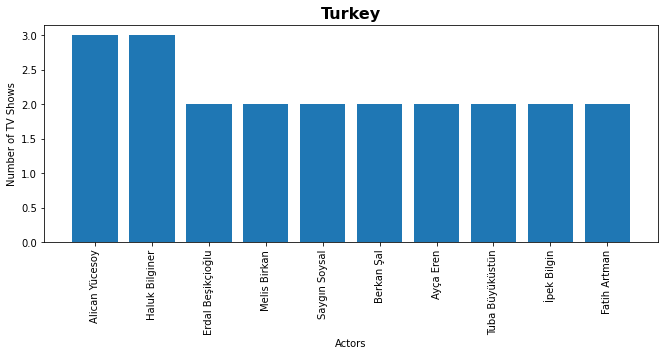

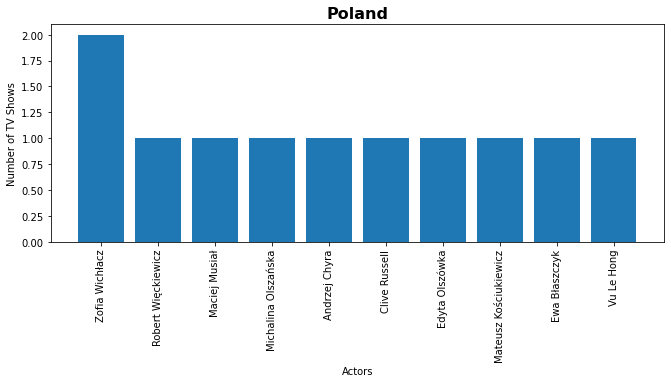

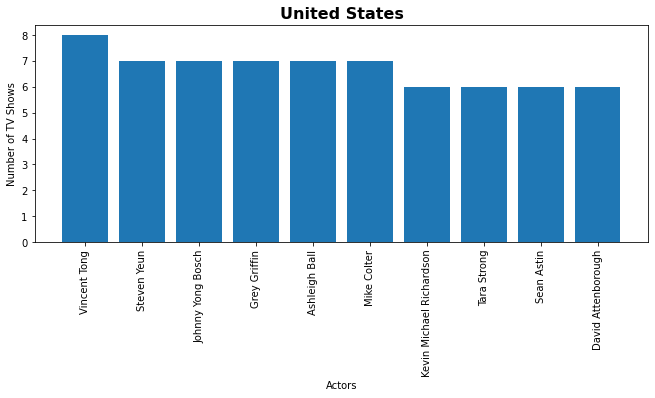

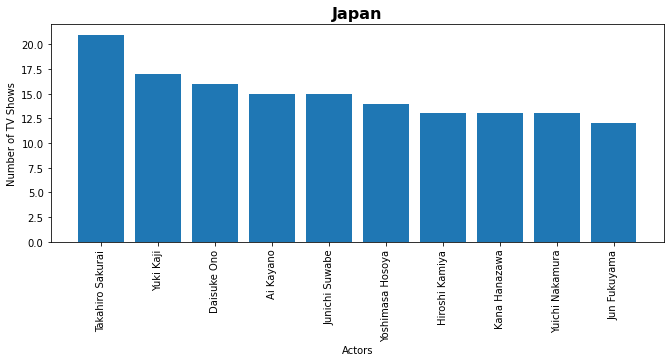

...

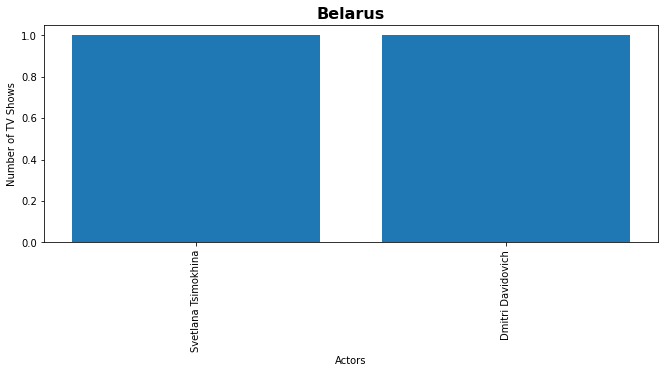

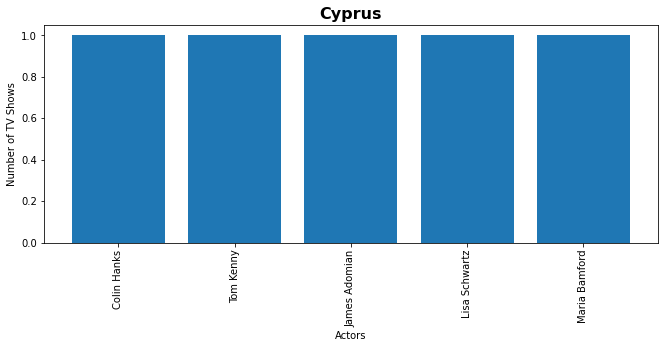

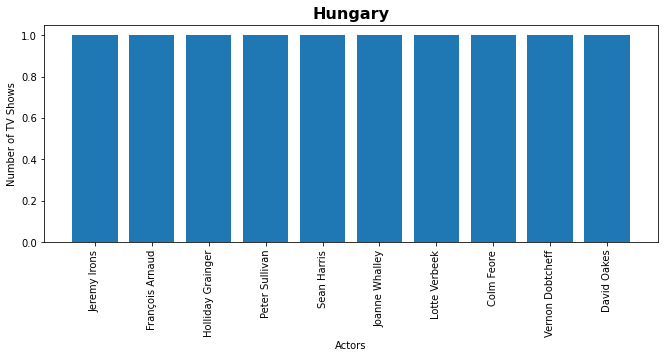

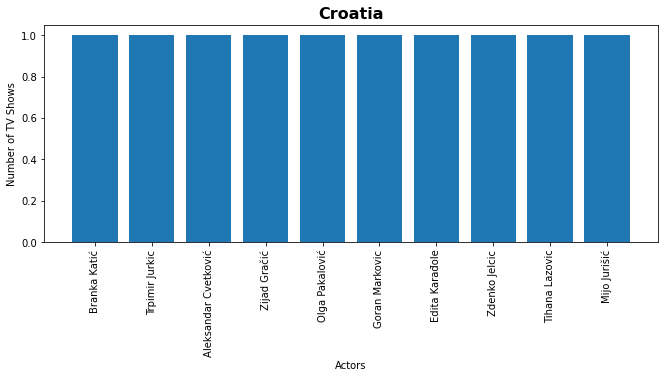

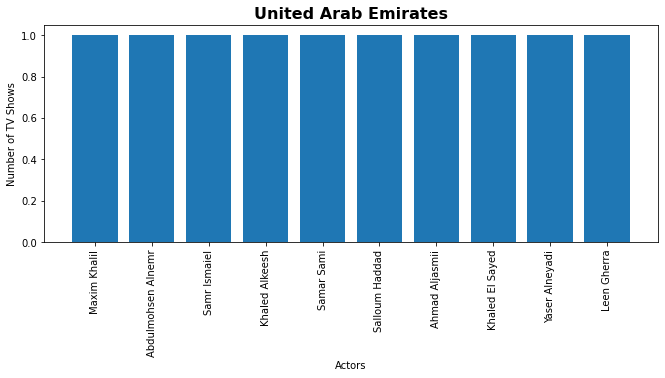

In [ ]:
#erwtima 5 - Tv Shows 
import itertools 
tempDf2 = df[df['type']=="TV Show"] # keep only TV Show-related recordings
tempDf2 = tempDf2[['country','cast']] # at a new data frame keep only the columns "country" and "cast"
tempDf2 = tempDf2.values.tolist() # convert the data frame to list
country_actors = {} # dictionary to count the number of TV shows that every actor have been play for each country
for x in tempDf2:  # for every record
  splitted_countries = x[0].split(", ") # split countries
  splitted_actors = x[1].split(", ")  # split kinds of movie (listed_in)
  for country in splitted_countries:  # for every country of the certain movie
    if country not in country_actors:  # if country does not exist in the country dictionary, add it 
      country_actors[country]= { }
    for actor in splitted_actors: # for every genre of this record
      if actor in country_actors[country]:
        country_actors[country][actor] += 1
      else:
        country_actors[country][actor] = 1

#------------------------------------------------------------------------------

# bar plot for every country
for country in country_actors.keys():
  country_actors[country] = {k: v for k, v in sorted(country_actors[country].items(), key=lambda item: item[1],reverse=True)} # make a sort for a better printing of the results
  country_actors[country] = dict(itertools.islice(country_actors[country].items(), 10))

for country in country_actors.keys():
  temp_dict = country_actors[country]
  plt.figure(figsize=(11, 4))
  plt.bar(range(len(temp_dict)), temp_dict.values(), align='center')
  plt.xticks(range(len(temp_dict)), temp_dict.keys())
  plt.xticks(rotation = 90)
  plt.title(country,fontsize = 16, fontweight="bold")
  plt.ylabel('Number of TV Shows');
  plt.xlabel('Actors');
  plt.show()

## **Ερώτημα 6** 


---


Από το αρχίκο dataframe παίρνουμε όλες τις εγγραφές που αφορούν τις ταινίες (type==Movie) με column το rating και τις εκχωρούμε σε ένα καινούριο dataframe. Στη συνέχεια μέσω της μεθόδου value_counts στο καινούργιο dataframe βρίσκουμε για κάθε προτεινόμενη ηλικιακή κατηγορία των αριθμό των ταινιών που τους αντιστοιχει. Έτσι, καλώντας την συνάρτηση ***findAges()***, με όρισμα το παραπάνω dataframe τροποιημένο σε λίστα, κάνουμε την κατάλληλη κατηγοροποιήση των συμβόλων ηλικίας όπως περιγράφεται στην εκφώνηση και επιστρέφουμε απο την συνάρτηση ενα νέο dataframe με *Age-Category* και *Count* ως columns και τις αντίστοιχες εγγραφές. Ομόιως, κάνουμε το ίδιο και για τις εγγραφές που αφορούν τις σειρές (type==TV Show) και τελικά εκτυπώνουμε ένα γράφημα με τα 2 dataframe (που δημιουργήθηκαν από τις κλήσεις της συνάρτησης ***findAges()***) για σειρές και για ταινίες συγκριτικα για κάθε κατηγορία.

***`Το netflix υποστηρίζει ότι παρέχει πλούσιο περιεχόμενο για όλες τις ηλικίες.`***

Από το παρακάτω γράφημα συμπεραίνουμε ότι δεν ειναι αληθής η πρόταση, καθώς είναι φανερό οτι το netflix δεν έχει εξισορροπημένο περιεχόμενο για όλες τις ηλικιακές κατηγορίες.




In [ ]:
#erwtima 6
def findAges(categoryList):
  # counters for every age category
  littleKids=0
  olderKids=0
  teens=0
  mature=0
  for rating,count in categoryList:
    if rating=="G" or rating=="TV-Y" or rating=="TV-G":
      littleKids+=count 
    elif rating=="PG" or rating=="TV-Y7" or rating=="TV-Y7-FV" or rating=="TV-PG":
      olderKids+=count
    elif rating=="PG-13" or rating=="TV-14":
      teens+=count
    else:
      mature+=count
  count_list = [littleKids, olderKids, teens, mature]
  category_list = ["Little Kids", "Older Kids", "Teens", "Mature"]
  # merge these to lists to make a dataframe
  newzip = list(zip(category_list,count_list))
  resDf = pd.DataFrame(newzip)
  resDf.columns = ['Age-Category','Count']
  return resDf

#------------------------------------------------------------------------------

moviesDf = df[df['type']=="Movie"] # keep only movies-related recordings
newMovRes = moviesDf.value_counts('rating') # count the unique age symbols
newMoviesDf = newMovRes.to_frame(name='Count') # make the previous result database
newMoviesDf.reset_index(inplace = True,level='rating') # formatting
newMoviesList = newMoviesDf.values.tolist()
resultMovies = findAges(newMoviesList)

#------------------------------------------------------------------------------

showsDf = df[df['type']=="TV Show"] # keep only TV Show-related recordings
newShowRes = showsDf.value_counts('rating') # count the unique age symbols
newShowsDf = newShowRes.to_frame(name='Count') # make the previous result database
newShowsDf.reset_index(inplace = True,level='rating') # formatting
newShowsList = newShowsDf.values.tolist()
resultShows = findAges(newShowsList)

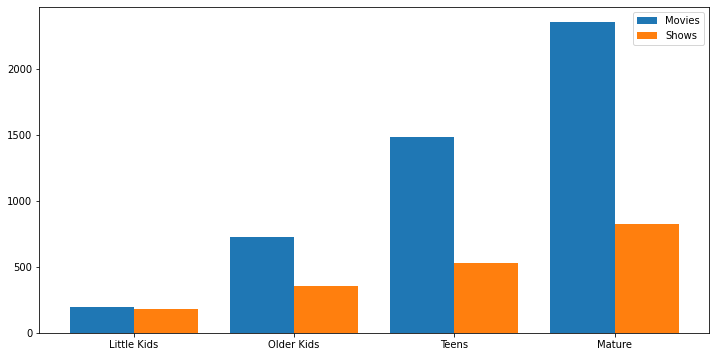

In [ ]:
#erwtima 6 plot

# finnaly just printing the movies and the tv shows age categories in a common bar plot
import numpy as np

z = ["Little Kids", "Older Kids", "Teens", "Mature"]

fig, ax = plt.subplots(figsize=(12, 6))

bar_width = 0.4

x = np.asarray([1,2,3,4])

b1 = ax.bar(x, resultMovies['Count'],width=bar_width,label='Movies')
    
b2 = ax.bar(x + bar_width,resultShows['Count'],width=bar_width,label='Shows')

ax.set_xticks(x + bar_width / 2)
ax.set_xticklabels(z)
ax.legend();

## **Ερώτημα 7** 


---


Από το αρχίκο dataframe παίρνουμε όλες τις εγγραφές που αφορούν τις ταινίες (type==Movie) με column το date_added και τις εκχωρούμε σε ένα καινούριο dataframe. Στη συνέχεια για να πετυχουμε το ζητούμενο έχουμε ενα dictionary οπου κάθε key του αντιπροσωπεύει έναν μήνα και ως item τον αντίστοιχο αριθμό ταινιών που καταχωρούνται στο netflix τον μήνα αυτόν. Έτσι, εκτυπώνουμε ένα ραβδοειδής γραφήμα με βάση το dictionary οπου στον άξονα x έχουμε όλους τους μήνες και στον άξονα y των αριθμό των ταινιών.

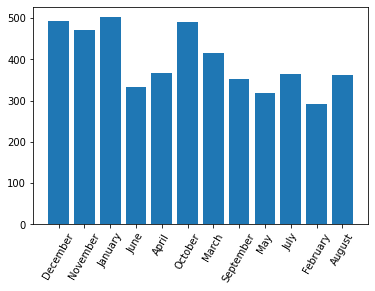

In [ ]:
#erwtima 7 
ques7=df[df['type']=="Movie"] # keep only movies-related recordings
ques7=ques7['date_added'] # at a new data frame keep only the column "date_added"
ques7=ques7.values.tolist() # convert the data frame to list
perMonth={} # dictionary to count for each month the movie premieres
for q in ques7:
  month = q.split()
  if month[0] in perMonth:
    perMonth[month[0]]+=1
  else:
    perMonth[month[0]]=1

#------------------------------------------------------------------------------

# bar plot 
plt.bar(range(len(perMonth)), list(perMonth.values()), align='center')
plt.xticks(range(len(perMonth)), list(perMonth.keys()))

plt.xticks(rotation = 60)
plt.show()

## **Ερώτημα 8** 


---


Από το αρχίκο dataframe παίρνουμε όλες τις εγγραφές με column μονο το listed_in και τις εκχωρούμε σε ένα καινούριο dataframe. Στη συνέχεια για να πετυχουμε το ζητούμενο έχουμε ενα dictionary οπου κάθε key του αντιπροσωπεύει ένα είδος ταινίας και ως item τον αντίστοιχο αριθμό ταινιών-σειρών που ανήκουν στο συγκεκριμένο καθε φορά είδος. Έτσι, εκτυπώνουμε ένα pie γραφήμα με βάση το dictionary οπου δέιχνουμε τα ποσοστά για κάθε είδος περιεχομένου που επικρατεί στο netflix.

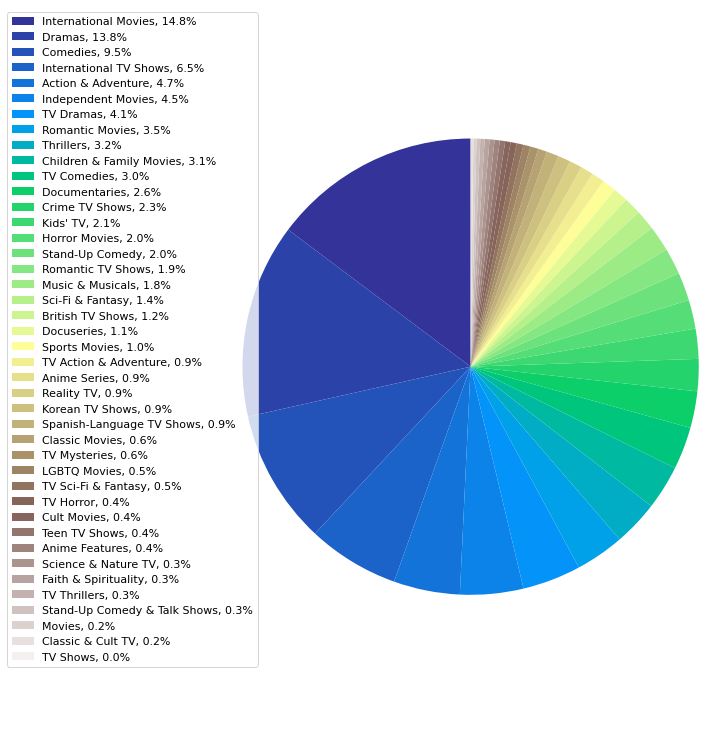

In [ ]:
#erwtima 8
ques8=df['listed_in'] # at a new data frame keep only the column "listed_in"
perGenre={} # dictionary to count for each genre the movies and the TV Shows that it has
for q in ques8:
  genre = q.split(", ") # split the genres in list, a movie or a TV show may belongs to more than one genres
  for g in genre:
    if g in perGenre:
      perGenre[g]+=1
    else:
      perGenre[g]=1


#------------------------------------------------------------------------------

labels = []
sizes = []
sorted_by_persent = {k: v for k, v in sorted(perGenre.items(), key=lambda item: item[1],reverse=True)} # make a sort for a better printing of the results
for x, y in sorted_by_persent.items():
    labels.append(x)
    sizes.append(y)

# Pie Plot

fig1, ax1 = plt.subplots(figsize=(10, 10))
fig1.subplots_adjust(0.3,0,1,1)


theme = plt.get_cmap('terrain')
ax1.set_prop_cycle("color", [theme(1. * i / len(sizes)) for i in range(len(sizes))])

_, _ = ax1.pie(sizes, startangle=90)

ax1.axis('equal')
totalsum = sum(sizes) 
# sort legend by percentage
plt.legend(
    loc='upper left',
    labels=['%s, %1.1f%%' % (
        l, (float(s) / totalsum) * 100) for l, s in zip(labels, sizes)],
    prop={'size': 11},
    bbox_to_anchor=(0.0, 1),
    bbox_transform=fig1.transFigure
)

plt.show()

## **Ερώτημα 9** 


---


Από το αρχίκο dataframe παίρνουμε όλες τις εγγραφές που έχουν "γνωστό" σκηνοθέτη (df['director'] != "Unknown Director") έχοντας ως columns τα country, director και τις εκχωρούμε σε ένα καινούριο dataframe. Στη συνέχεια για να πετυχουμε το ζητούμενο έχουμε ενα dictionary οπου κάθε key του αντιπροσωπεύει μια χώρα και κάθε item του αποτελείται από ένα set (έτσι ώστε να μετράμε τον κάθε σκηνοθέτη μόνο μια φορά) οπου αποθηκεύουμε τους σκηνοθέτες της κάθε χώρας. Έτσι, εκτυπώνουμε  ενα ραβδόγραμμα με βάση το παραπάνω dictionary, όπου στον άξονα x έχουμε όλες τις χώρες και στον άξονα y τον αριθμό των σκηνοθετών που έχει η κάθε μια.

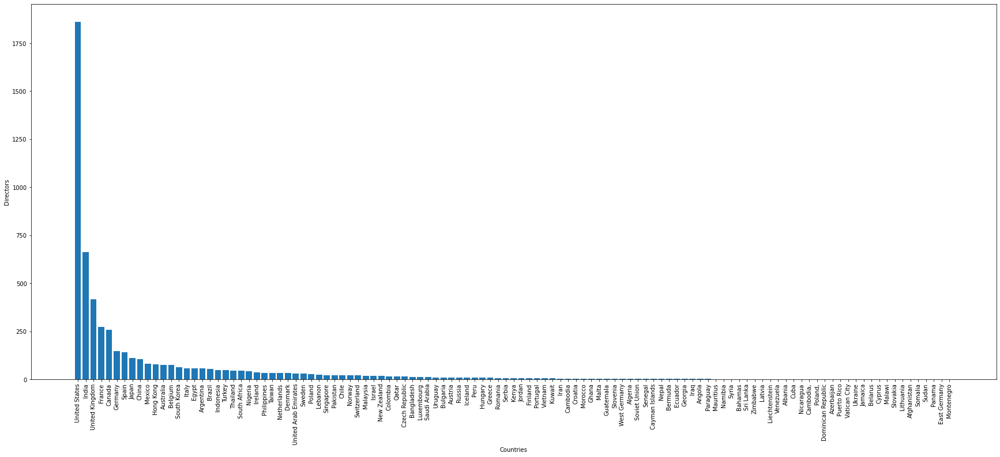

In [ ]:
#erwtima 9
tempDf=df[df['director']!="Unknown Director"]
temp = df[['country','director']] # at a new data frame keep only the columns "country" and "listed_in"
temp = temp.values.tolist() # convert the dataframe to list 
directorsPerCountry = {} # dictionary to count for each country how many directors has
for x in temp:  # for every record
  countries = x[0].split(", ") # split countries, a movie or a TV Show may "belongs" to many countries
  directors = x[1].split(", ") # split directors, a movie or a TV Show may has many countries
  for country in countries:  # for every country of the certain movie
    if country not in directorsPerCountry:
      directorsPerCountry[country]= set()
    for d in directors:
      if d not in directorsPerCountry[country]:
        directorsPerCountry[country].add(d)

#------------------------------------------------------------------------------
# bar plot 
countries = []
directorCount = []
for x, y in directorsPerCountry.items():
    countries.append(x)
    directorCount.append(len(y)) 

result_dict = dict(zip(countries, directorCount))
sorted_result = {k: v for k, v in sorted(result_dict.items(), key=lambda item: item[1],reverse=True)} # make a sort for a better printing of the results
plt.figure(figsize=(30, 12))
plt.bar(range(len(sorted_result)), list(sorted_result.values()), align='center')
plt.xticks(range(len(sorted_result)), list(sorted_result.keys()), rotation=90)
plt.xlabel('Countries');
plt.ylabel('Directors');
plt.show()

Από το αρχίκο dataframe παίρνουμε όλες τις εγγραφές που έχουν "γνωστό" σκηνοθέτη (df['director'] != "Unknown Director") με columns τα country, director και τις εκχωρούμε σε ένα καινούριο dataframe. Στη συνέχεια για να πετυχουμε το ζητούμενο έχουμε ενα dictionary οπου κάθε key του αντιπροσωπεύει μια χώρα και κάθε item του αποτελείται επίσης απο ένα dictionary οπου στα keys του έχουμε όλους τους σκηνοθέτες που έχουν επιμεληθεί σε ταίνια στην συγκεκριμένη χώρα και στα items τον αντίστοιχο αριθμό των ταινιών τους. Έτσι, εκτυπώνουμε μια σειρά απο ραβδοειδής γραφήματα για κάθε χώρα οπου ουσιαστικά δείχνουν τους σκηνοθέτες και των αριθμό των ταινιών τους στις χώρες αυτες. Στο κάθε γράφημα φαίνονται οι 10 σκηνοθέτες με τις περισσότερες ταινίες στην αντίστοιχη χώρα καθώς και ο αριθμός αυτών.

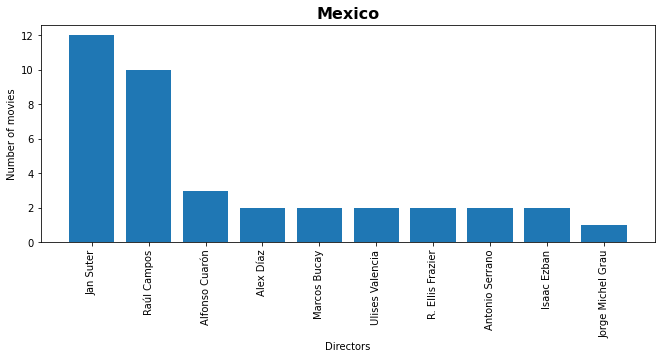

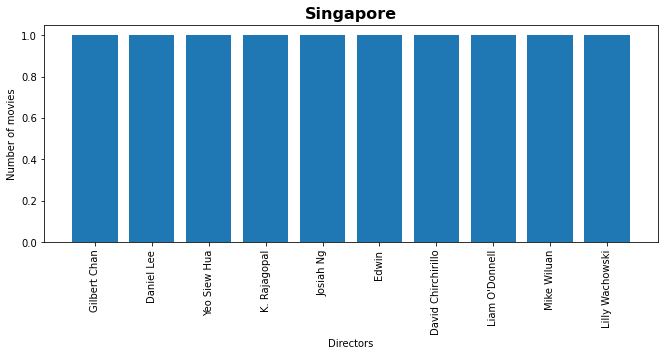

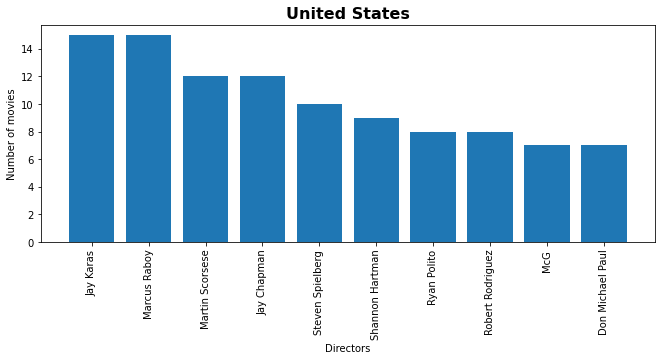

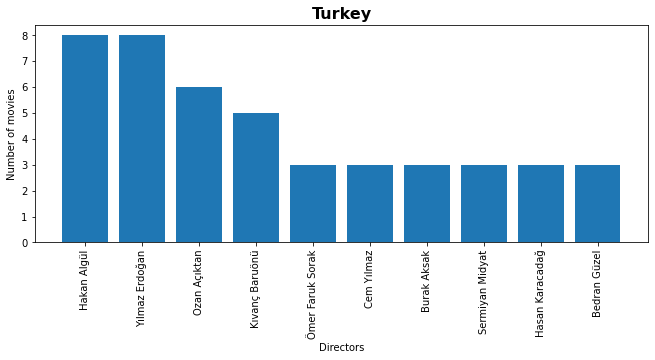

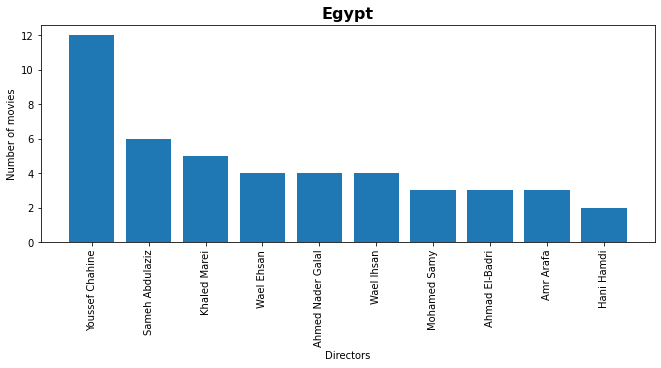

...

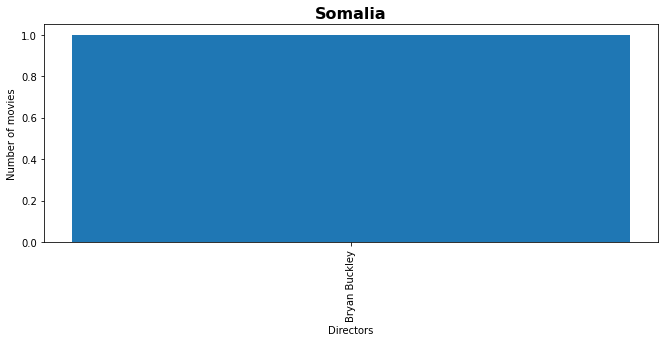

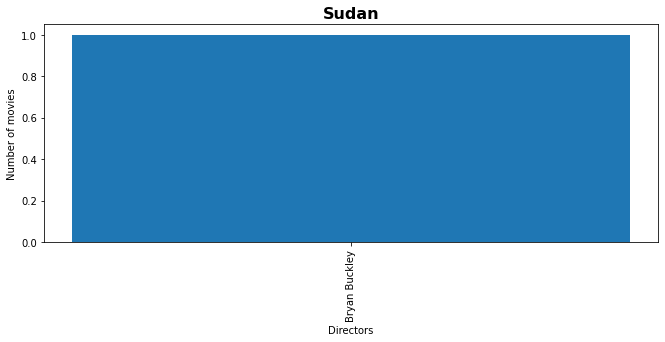

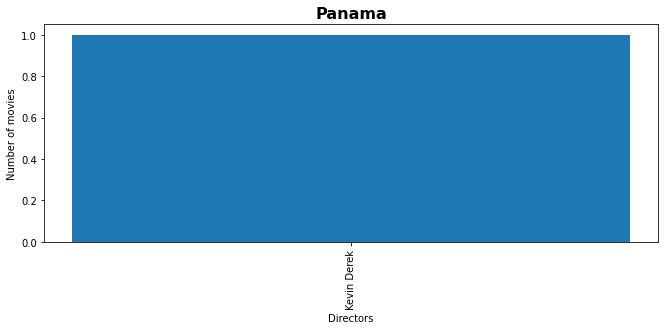

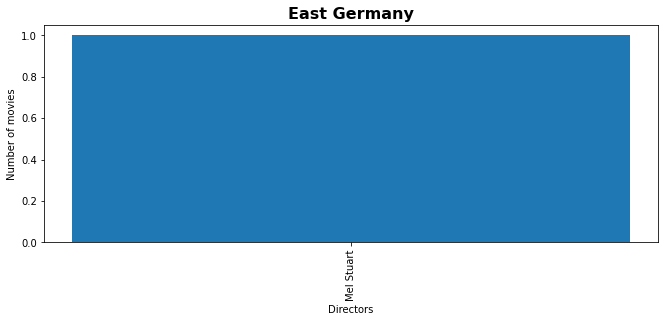

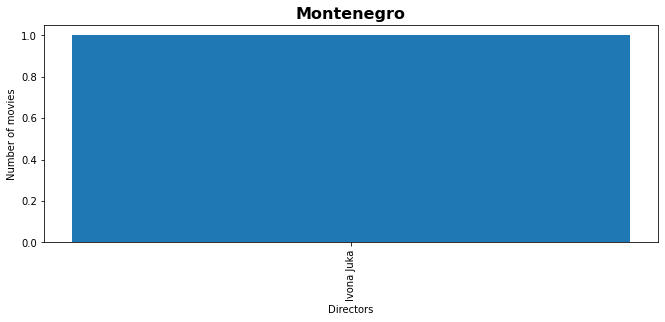

In [ ]:
#erwtima 9 - Top 10 directors for every country
import itertools 
tempDf=df[df['director']!="Unknown Director"]
tempDf = tempDf[['country','director']] # at a new data frame keep only the columns "country" and "cast"
tempDf = tempDf.values.tolist() # convert the data frame to list
country_directors = {}
for x in tempDf:  # for every record
  splitted_countries = x[0].split(", ") # split countries
  splitted_directors = x[1].split(", ")  # split directors 
  for country in splitted_countries:  # for every country of the certain movie or TV show
    if country not in country_directors:  # if country does not exist in the country dictionary, add it 
      country_directors[country] = { }
    for director in splitted_directors: # for every genre of this record
      if director in country_directors[country]:
        country_directors[country][director] += 1
      else:
        country_directors[country][director] = 1


# bar plot for every country
for country in country_directors.keys():
  country_directors[country] = {k: v for k, v in sorted(country_directors[country].items(), key=lambda item: item[1],reverse=True)} # make a sort for a better printing of the results
  country_directors[country] = dict(itertools.islice(country_directors[country].items(), 10))

for country in country_directors.keys():
  temp_dict = country_directors[country]
  plt.figure(figsize=(11, 4))
  plt.bar(range(len(temp_dict)), temp_dict.values(), align='center')
  plt.xticks(range(len(temp_dict)), temp_dict.keys())
  plt.xticks(rotation = 90)
  plt.title(country,fontsize = 16, fontweight="bold")
  plt.ylabel('Number of movies');
  plt.xlabel('Directors');
  plt.show()



## **Ερώτημα 10** 


---


Από το αρχίκο dataframe παίρνουμε όλες τις εγγραφές που αφορούν τις σειρές (type==TV Show) με columns τα title, duration και τις εκχωρούμε σε ένα καινούριο dataframe. Στη συνέχεια για να πετυχουμε το ζητούμενο έχουμε δύο dictionaries:


*   ***series***

    κάθε key του αντιπροσωπεύει μια σειρά (TV Show) και ως item εχουμε τον αντίστοιχο αριθμό seasons που έχει η κάθε σειρά.
*   ***seasonCount***

    κάθε key του αντιπροσωπεύει έναν συγκεκριμένο αριθμό από season και ως item το συνολικό πλήθος όλων των σειρών που έχουν "φτάσει" μεχρι αυτο το season.




  Έτσι, εκτυπώνουμε ενα ραβδόγραμμα με βάση το παραπάνω dictionary seasonCount, όπου στον άξονα x έχουμε τα seasons και στον άξονα y το πλήθος αυτών των season που αφορά ουστιαστικά τις σειρές ως σύνολο.






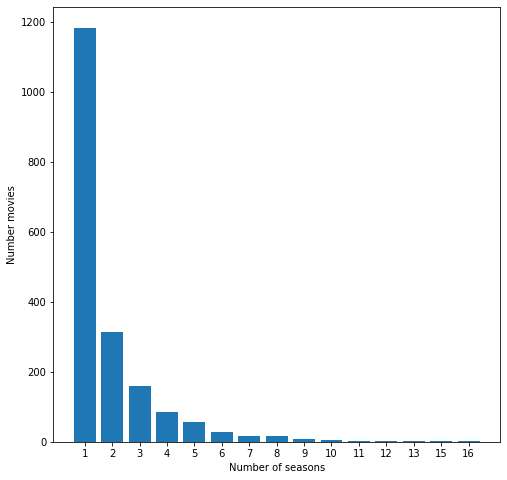

In [ ]:
#erwtima 10
ques10=df[df['type']=="TV Show"] # keep only TV Show-related recordings
ques10=ques10[['title','duration']] # at a new data frame keep only the columns "title" and "duration"
ques10=ques10.values.tolist() # convert the dataframe to list
series={} # dictionary to save for each TV Show how many seasons has
for q in ques10:
  name = q[0]
  num = q[1].split()
  series[name]=int(num[0])

seasonCount  = {} # dictionary to count for each season how many TV shows has
for x,y in series.items():
  if y in seasonCount:
    seasonCount[y] += 1
  else:
    seasonCount[y] = 1

# make a sort for a better printing of the results
sortedDict = {}
for i in sorted(seasonCount):
  sortedDict[i] = seasonCount[i]

plt.figure(figsize=(8, 8))
plt.bar(range(len(sortedDict)), list(sortedDict.values()), align='center')
plt.xticks(range(len(sortedDict)), list(sortedDict.keys()))

plt.xticks(rotation = 0)
plt.xlabel('Number of seasons');
plt.ylabel('Number movies');
plt.show()

## **Ερώτημα 11** 


---


Αρχικά φορτώνουμε και τα 2 υπόλοιπα αρχέια (IMDb ratings.csv και IMDb movies.csv) που μας δίνονται σε αντίστοιχα dataframes και στην συνέχεια για να απαντήσουμε στο ερώτημα κάνουμε μια "συγχώνευση" όλων των dataframes ώστε να πάρουμε την πληροφορία που θέλουμε, αυτό το πετυχαίνουμε όπως θα λέγαμε στην SQL μέσω της εντολής JOIN ( το pandas μας μας δίνει αυτήν την δυνατότητα μέσω την μεθόδου merge() ). Αναλυτικότερα, πρώτα συνενώνουμε τα dataframe που αντιστοιχουν στα αρχεία :
IMDb movies.csv και netflix_titles.csv με κλειδί την κοινή στήλη με όνομα "title", την συνένωση αυτήν την εκχωρούμε σε ενα νέο dataframe κρατώντας τελικά μόνο τις στήλες "title" και "imdb_title_id". Στη συνέχεια, συνενώνουμε το παραπάνω νέο dataframe (με όνομα merged_inner) με το αρχείο IMDb ratings.csv, επίσης την συνένωση αυτή την εκχωρούμε σε ένα νέο dataframe κρατώντας μόνο τις στήλες "title" και "weighted_average_vote". Τέλος, απο το dataframe merged_inner κρατάμε τις 100 ταινίες με την πιο υψηλη βαθμολογία και τις παρουσιάζουμε στο παρακάτω ραβδόγραμμα.

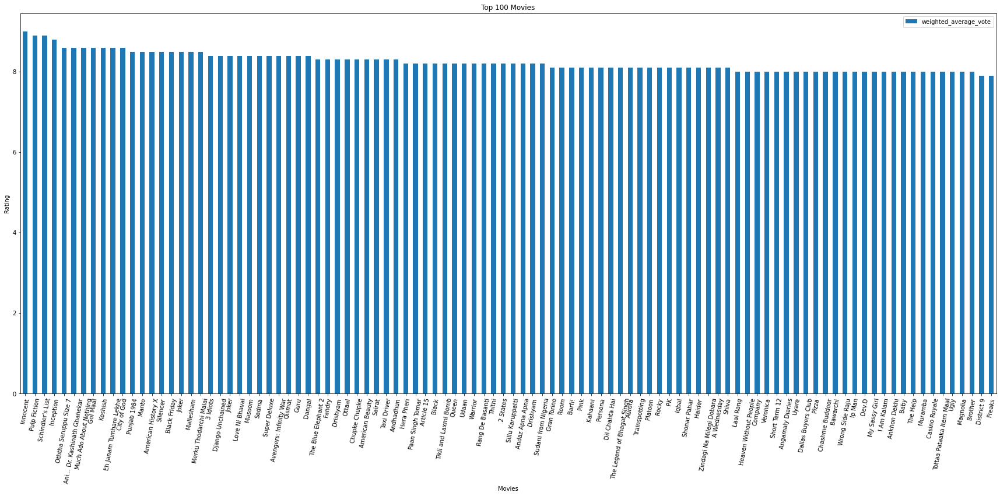

In [ ]:
#erwtima 11
Location = r'IMDb ratings.csv' 
rating = pd.read_csv(Location) # make a dataframe from the IMDb ratings.csv

Location = r'IMDb movies.csv' 
movs = pd.read_csv(Location, sep=',', error_bad_lines=False, index_col=False, dtype='unicode') # make a dataframe from the IMDb movies.csv

merged1 = pd.merge(left=df, right=movs, left_on='title', right_on='title') # merge/concatenate/join the two dataframes (netflix_movies.csv and IMDb movies.csv) with key the "title" column
merged1=merged1[["title","imdb_title_id"]] # keep only the columns "title" and "imdb_title_id"
merged_inner = pd.merge(left=merged1, right=rating, left_on='imdb_title_id', right_on='imdb_title_id') # merge/concatenate/join the two dataframes (the new one and IMDb ratings.csv) with key the "imdb_title_id" column
merged_inner=merged_inner[["title","weighted_average_vote"]] # keep only the columns "title" and "weighted_average_vote"

merged_inner = merged_inner.sort_values('weighted_average_vote') # make a sort for a better printing of the results
merged_inner.reset_index(inplace=True) # formatting
del merged_inner['index'] # delete the index column (not used)
# print(merged_inner.tail(10))

#------------------------------------------------------------------------------

top100 = merged_inner.tail(100) # take from the data frame the top 100 movies with the highest rating
top100 = top100.iloc[::-1] # keep these in inverse order
# bar plot
top100.plot.bar(x='title',rot=80,figsize=(30, 12));
plt.title('Top 100 Movies');
plt.xlabel('Movies');
plt.ylabel('Rating');




#Μέρος 2ο


---



## **Ερώτημα 1** 


---

Από το αρχίκο dataframe παίρνουμε όλες τις εγγραφές που αφορούν τις ταινίες (type==Movie) και κρατάμε μόνο τις στήλες show_id, title και description. Δημιουργούμε δυο λίστες όπου η μία περιέχει tuples με το id και τον τίτλο της κάθε ταινίας (id_titles) και η άλλη λίστα (descriptions) περιέχει το description της ταινίας που βρίσκεται στο αντίστοιχο index.

### **Ερώτημα 1.a** 


---

Στην συνέχεια χρησιμοποιούμε τον CountVectorizer έτσι ώστε να υπολογίσουμε τους boolean BoW πίνακες. 
Πιο συγκεκριμένα:
- **Bow unigram** : τα min_df και max_df τα έχουμε "αφήσει" στις deafult τιμές τους καθώς παρατηρίσαμε ότι έτσι παίρνουμε ακριβέστερα αποτελέσματα στις συγκρίσεις των επόμενων ερωτημάτων. Αυτό βέβαια έχει ως αποτέλεσμα, οι πίνακες που παράγονται να είναι μεγαλου μεγέθους και κατ'επέκταση οι συγκρίσεις του ερωτήματος 2 να χρειάζονται περισσότερο χρόνο. Ωστόσο, πιστέυουμε ότι το trade-off της ακρίβειας που παίρνουμε με τα default min_df και max_df είναι καλύτερο. Επίσης, αγνοούνται όλα τα stop words της αγγλικής γλώσσας. Ο τελικός πίνακας που προκύπτει είναι ο unigram_bow_array.
- **Bow bigram** : ομοίως για τα min_df και max_df. Επίσης, προφανώς, έχει οριστεί το ngram_range=(2,2) έτσι ώστε να προκύψει ο bigram πίνακας. Ο τελικός πίνακας που προκύπτει είναι ο bigram_bow_array.

Σαν όρισμα της fit_transform και στις δυο περιπτώσεις δίνεται η λίστα descriptions, δηλαδή η λίστα που περιέχει τις περιγραφές όλων των ταινιών.

In [ ]:
import numpy as np

#PART 2
# erwtima 1.a
from sklearn.feature_extraction.text import CountVectorizer
movies_only = df[df['type']=="Movie"]   # keep only the movies from the original dataframe
filteredDf = movies_only[['show_id','title','description']] # keep only the colums that contain show_id, title and description
df_list =filteredDf.values.tolist() # convert the dataframe into a list
id_titles = []
descriptions = []
for t in df_list: # split the dataframe list in 2 list
  id_titles.append([t[0],t[1]]) # id_titles will contain tuples (id,title) for every movie
  descriptions.append(t[2]) # description will contain the description of every movie

unigram_bow_vectorizer = CountVectorizer(max_df=1.0, min_df=1, max_features=100000, stop_words='english',ngram_range=(1,1)) # initialize the unigram CountVectorizer
unigram_bow = unigram_bow_vectorizer.fit_transform(descriptions)  # run the vectorizer for all the descriptions
unigram_bow_array = unigram_bow.toarray() # convert the result of the vectorizer into an array
unigram_bow_array = np.array(unigram_bow_array,dtype=bool)
print('Unigram Bow array was created succesfully. The array size is:',unigram_bow.shape)

#------------------------------------------------------------------------------

# do the same thing for bigram (ngram_range=(2,2))
bigram_bow_vectorizer = CountVectorizer(max_df=1.0, min_df=1, max_features=100000, stop_words='english',ngram_range=(2,2))
bigram_bow = bigram_bow_vectorizer.fit_transform(descriptions)
bigram_bow_array = bigram_bow.toarray()
print('Bigram Bow array was created succesfully. The array size is:',bigram_bow.shape)

Unigram Bow array was created succesfully. The array size is: (4761, 13566)
Bigram Bow array was created succesfully. The array size is: (4761, 54582)


Για λόγους επίδειξης και επαλήθευσης των αποτελεσμάτων μετατρέπουμε τους πίνακες σε dataframes και εκτυπώνουμε τις 10 πρώτες γραμμές τους. Σαν index, έχουμε προσθέσει το id της ταινίας που αντιστοιχεί η κάθε γραμμή. Επίσης για όλους τους πίνακες που εκτυπώνονται στα ερωτήματα 1 και 2 εκτυπώνουμε μόνο 1000 στήλες. Εκτυπώνοντας όλες τις στήλες των πινάκων, το .ipynb αρχείο γίνεται πολύ μεγάλο (>100ΜΒ), με αποτέλεσμα να "crashαρει" το google colab.


In [ ]:
pd.set_option("display.max_rows", None, "display.max_columns", 1000)
print("Size of BoW Unigram array: ",unigram_bow.shape)
print("Printing the first 10 rows of the BoW unigram array: \n")
printDf = pd.DataFrame(unigram_bow_array, columns=unigram_bow_vectorizer.get_feature_names(), index = [id[0] for id in id_titles])
printDf.head(10)

Size of BoW Unigram array:  (4761, 13566)
Printing the first 10 rows of the BoW unigram array: 



000    007     10    100   1000   10th     11    112   11th     12  \
s2   False  False  False  False  False  False  False  False  False  False   
s3   False  False  False  False  False  False  False  False  False  False   
s4   False  False  False  False  False  False  False  False  False  False   
s5   False  False  False  False  False  False  False  False  False  False   
s7   False  False  False  False  False  False  False  False  False  False   
s8   False  False  False  False  False  False  False  False  False  False   
s9   False  False  False  False  False  False  False  False  False  False   
s10  False  False  False  False  False  False  False  False  False  False   
s11  False  False  False  False  False  False  False  False  False  False   
s14  False  False  False  False  False  False  False  False  False  False   

      12th     13     14   14th     15    150    15k     16   1666   16th  \
s2   False  False  False  False  False  False  False  False  False  False   
s3   False  False  False  False  False  False  False  False  False  False   
s4   False  False  False  False  False  False  False  False  False  False   
s5   False  False  False  False  False  False  False  False  False  False   
s7   False  False  False  False  False  False  False  False  False  False   
s8   False  False  False  False  False  False  False  False  False  False   
s9   False  False  False  False  False  False  False  False  False  False   
s10  False  False  False  False  False  False  False  False  False  False   
s11  False  False  False  False  False  False  False  False  False  False   
s14  False  False  False  False  False  False  False  False  False  False   

        17     18  1800s   1812   1843   1854  1860s   1866   1867   1870  \
s2   False  False  False  False  False  False  False  False  False  False   
s3   False  False  False  False  False  False  False  False  False  False   
s4   False  False  False  False  False  False  False  False  False  False   
s5   False  False  False  False  False  False  False  False  False  False   
s7   False  False  False  False  False  False  False  False  False  False   
s8   False  False  False  False  False  False  False  False  False  False   
s9   False  False  False  False  False  False  False  False  False  False   
s10  False  False  False  False  False  False  False  False  False  False   
s11  False  False  False  False  False  False  False  False  False  False   
s14  False  False  False  False  False  False  False  False  False  False   

     1880s   1881   1888   1890  1890s   1892   1895   1899   18th     19  \
s2   False  False  False  False  False  False  False  False  False  False   
s3   False  False  False  False  False  False  False  False  False  False   
s4   False  False  False  False  False  False  False  False  False  False   
s5   False  False  False  False  False  False  False  False  False  False   
s7   False  False  False  False  False  False  False  False  False  False   
s8   False  False  False  False  False  False  False  False  False  False   
s9   False  False  False  False  False  False  False  False  False  False   
s10  False  False  False  False  False  False  False  False  False  False   
s11  False  False  False  False  False  False  False  False  False  False   
s14  False  False  False  False  False  False  False  False  False  False   

     1900s   1901   1902   1905   1913   1920  1920s   1921   1927  1930s  \
s2   False  False  False  False  False  False  False  False  False  False   
s3   False  False  False  False  False  False  False  False  False  False   
s4   False  False  False  False  False  False  False  False  False  False   
s5   False  False  False  False  False  False  False  False  False  False   
s7   False  False  False  False  False  False  False  False  False  False   
s8   False  False  False  False  False  False  False  False  False  False   
s9   False  False  False  False  False  False  False  False  False  False   

In [ ]:
print("Size of BoW Bigram array: ",bigram_bow.shape)
print("Printing the first 10 rows of the BoW bigram array: \n")
printDf = pd.DataFrame(bigram_bow_array, columns=bigram_bow_vectorizer.get_feature_names(), index = [id[0] for id in id_titles])
printDf.head(10)

Size of BoW Bigram array:  (4761, 54582)
Printing the first 10 rows of the BoW bigram array: 



,000 euros,000 feet,000 jewish,000 kilometer,000 new,000 prize,000 rounds,000 wasn,000 year,000 years,007 finds,007 installment,007 pitted,007 tracking,10 000,10 city,10 cornish,10 days,10 million,10 prepare,10 seat,10 year,10 years,100 jews,100 million,100 years,1000 started,10th birthday,10th year,11 26,11 day,11 los,11 simple,11 year,11 years,112 mile,11th century,12 dance,12 hours,12 murdering,12 round,12 short,12 year,12 years,12th birthday,12th century,13 000,13 cameras,13 city,13 deaths,13 year,13 years,14 year,14th century,14th general,15 buses,15 popular,15 year,15 years,150 years,15k just,16 block,16 jobs,16 year,16 years,1666 teenage,16th century,17 despite,17 year,18 000,18 beluga,18 sentimental,18 year,1800s england,1812 native,1843 crippled,1854 1867,1860s vengeful,1866 texas,1867 period,1870 disfigured,1880s france,1881 film,1888 amsterdam,1890 ireland,1890s india,1892 axing,1895 mumbai,1899 young,18th century,19 days,19 year,1900s indonesian,1901 spain,1902 risks,1905 drifter,1913 director,1920s beijing,1920s denmark,1920s hawaii,1920s retired,1920s shanghai,1921 barcelona,1927 fiery,1930s british,1930s hollywood,1930s london,1930s paris,1930s poland,1930s ushering,1931 young,1937 spanish,1940s china,1942 protect,1944 allied,1944 northern,1945 hiroshima,1947 war,1949 freedoms,1950s georgia,1950s glamorous,1950s harlem,1950s makassar,1950s suburbia,1953 women,1958 sparks,1959 young,1960 montana,1960s animated,1960s australian,1960s hollywood,1960s london,1960s mississippi,1960s musical,1961 broadcast,1961 vostok,1962 ambitious,1962 brooklyn,1962 cuban,1967 arab,1968 comedy,1968 new,1968 strangers,1969 moon,1969 ponders,1970s 1980s,1970s 80s,1970s australia,1970s cleveland,1970s france,1970s friends,1970s la,1970s mexico,1970s mixing,1970s rises,1970s rock,1970s russell,1970s spent,1970s villain,1971 album,1971 brilliant,1971 fallen,1972 gran,1974 rural,1975 government,1975 rolling,1976 beirut,1979 concert,1979 engineer,1979 horror,1979 single,1980 employment,1980 massacre,1980 tense,1980 widowed,1980 winter,1980s 1990s,1980s crusading,1980s harlem,1980s heavy,1980s hong,1980s new,1980s punjab,1980s tale,1980s teen,1980s tokyo,1980s tries,1980s tv,1981 broadway,1981 new,1983 abductors,1983 live,1984 classic,1984 increasingly,1984 young,1985 classic,1985 receives,1985 vessel,1986 ron,1986 tommaso,1987 martial,1988 documentary,1989 championship,1989 offers,1989 turning,1990s housewife,1990s love,1990s malaysia,1990s mumbai,1990s personal,1990s stop,1990s try,1991 film,1991 madrid,1992 la,1992 los,1992 radically,1993 bombing,1993 riots,1994 blockbuster,1994 world,1995 world,1996 danish,1996 japanese,1999 blockbuster,19th century,20 million,20 nin,20 plus,20 somethings,20 year,20 years,200 policemen,200 years,2002 el,2003 reluctant,2004 tsunami,2006 casino,2006 comic,2006 train,2008 2012,2008 comedy,200th anniversary,2010 concert,2011 cricket,2011 egyptian,2011 forcing,2011 live,2012 follow,2012 manager,2012 presidential,2013 bombay,2014 academy,2014 oscar,2014 standup,2015 film,2015 groups,2015 milan,2015 mission,2016 hit,2016 rudy,2016 tour,2018 john,2018 race,2019 stade,2020 film,2020 mad,2025 depicting,2029 elite,20s having,20s old,20th anniversary,20th century,20th consecutive,215 kilometer,21st birthday,21st century,21st year,22 countries,22 year,23 year,23 years,23rd century,24 hour,24 hours,24 male,25 years,25th anniversary,25th wedding,26 mile,26 terrorist,27 jimi,28 year,29 propose,30 000,30 days,30 foot,30 minute,30 operation,30 series,30 unpacks,30 year,30 years,300 miles,300 plate,30s overwhelmed,32 year,32 years,34 isoken,34 woman,35 insanity,35 year,36 hour,36th chamber,37th year,38 year,40 life,40 netflix,40 unemployed,40 year,40 years,400 pound,40s navigate,40s options,40s poking,40th anniversary,40th birthday,42 year,45 day,45 days,47 gory,47 thunderbolt,4bia anthology,4minute shinee,50 000,50 50,50 chance,50 days,50 ironman,50 million,50 states,50 stock,50 year,50 years,500 000,500 member,500 year,

### **Ερώτημα 1.b** 


---

Για την δημιουργία των πινάκων TF-IDF χρησιμοποιούμε τον TfidVectorizer.

Η διαδικασία είναι ακριβώς η ίδια με αυτήν που πειγράφηκε στο ερώτημα 1.a
Οι δυο πίνακες που προκύπτουν είναι:
- unigram_tfid_array 
- bigram_tfid_array

In [ ]:
#erwtima 1.b
from sklearn.feature_extraction.text import TfidfVectorizer

unigram_tfid_vectorizer = TfidfVectorizer(max_df=1.0, min_df=1, max_features=100000, stop_words='english',ngram_range=(1,1)) #initialize the TfidfVectorizer
unigram_tfid = unigram_tfid_vectorizer.fit_transform(descriptions)  # run the vectorizer for all the descriptions
unigram_tfid_array = unigram_tfid.toarray() # convert the result into an array
print('Unigram TF-IDF array was created succesfully. The array size is:',unigram_tfid.shape)
#------------------------------------------------------------------------------

# do the same thing for bigram (ngram_range=(2,2))
bigram_tfid_vectorizer = TfidfVectorizer(max_df=1.0, min_df=1, max_features=100000, stop_words='english',ngram_range=(2,2))
bigram_tfid = bigram_tfid_vectorizer.fit_transform(descriptions)
bigram_tfid_array = bigram_tfid.toarray()
print('Bigram TF-IDF array was created succesfully. The array size is:',bigram_tfid.shape)

Unigram TF-IDF array was created succesfully. The array size is: (4761, 13566)
Bigram TF-IDF array was created succesfully. The array size is: (4761, 54582)


Ομοίως με το ερώτημα 1.α, μετατρέπουμε τους 2 πίνακες σε dataframes και εκτυπώνουμε τις 10 πρώτες γραμμές τους.

In [ ]:
print("Size of TF-IDF Unigram array: ",unigram_tfid.shape)
print("Printing the first 10 rows of the TF-IDF unigram array: \n")
printDf = pd.DataFrame(unigram_tfid_array, columns=unigram_tfid_vectorizer.get_feature_names(), index = [id[0] for id in id_titles])
printDf.head(10)

Size of TF-IDF Unigram array:  (4761, 13566)
Printing the first 10 rows of the TF-IDF unigram array: 



000  007   10  100  1000  10th   11  112  11th   12  12th   13   14  \
s2   0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0   0.0  0.0   0.0  0.0  0.0   
s3   0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0   0.0  0.0   0.0  0.0  0.0   
s4   0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0   0.0  0.0   0.0  0.0  0.0   
s5   0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0   0.0  0.0   0.0  0.0  0.0   
s7   0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0   0.0  0.0   0.0  0.0  0.0   
s8   0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0   0.0  0.0   0.0  0.0  0.0   
s9   0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0   0.0  0.0   0.0  0.0  0.0   
s10  0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0   0.0  0.0   0.0  0.0  0.0   
s11  0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0   0.0  0.0   0.0  0.0  0.0   
s14  0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0   0.0  0.0   0.0  0.0  0.0   

     14th   15  150  15k   16  1666  16th   17   18  1800s  1812  1843  1854  \
s2    0.0  0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0    0.0   0.0   0.0   0.0   
s3    0.0  0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0    0.0   0.0   0.0   0.0   
s4    0.0  0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0    0.0   0.0   0.0   0.0   
s5    0.0  0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0    0.0   0.0   0.0   0.0   
s7    0.0  0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0    0.0   0.0   0.0   0.0   
s8    0.0  0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0    0.0   0.0   0.0   0.0   
s9    0.0  0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0    0.0   0.0   0.0   0.0   
s10   0.0  0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0    0.0   0.0   0.0   0.0   
s11   0.0  0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0    0.0   0.0   0.0   0.0   
s14   0.0  0.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0    0.0   0.0   0.0   0.0   

     1860s  1866  1867  1870  1880s  1881  1888  1890  1890s  1892  1895  \
s2     0.0   0.0   0.0   0.0    0.0   0.0   0.0   0.0    0.0   0.0   0.0   
s3     0.0   0.0   0.0   0.0    0.0   0.0   0.0   0.0    0.0   0.0   0.0   
s4     0.0   0.0   0.0   0.0    0.0   0.0   0.0   0.0    0.0   0.0   0.0   
s5     0.0   0.0   0.0   0.0    0.0   0.0   0.0   0.0    0.0   0.0   0.0   
s7     0.0   0.0   0.0   0.0    0.0   0.0   0.0   0.0    0.0   0.0   0.0   
s8     0.0   0.0   0.0   0.0    0.0   0.0   0.0   0.0    0.0   0.0   0.0   
s9     0.0   0.0   0.0   0.0    0.0   0.0   0.0   0.0    0.0   0.0   0.0   
s10    0.0   0.0   0.0   0.0    0.0   0.0   0.0   0.0    0.0   0.0   0.0   
s11    0.0   0.0   0.0   0.0    0.0   0.0   0.0   0.0    0.0   0.0   0.0   
s14    0.0   0.0   0.0   0.0    0.0   0.0   0.0   0.0    0.0   0.0   0.0   

     1899  18th   19  1900s  1901  1902  1905  1913  1920  1920s  1921  1927  \
s2    0.0   0.0  0.0    0.0   0.0   0.0   0.0   0.0   0.0    0.0   0.0   0.0   
s3    0.0   0.0  0.0    0.0   0.0   0.0   0.0   0.0   0.0    0.0   0.0   0.0   
s4    0.0   0.0  0.0    0.0   0.0   0.0   0.0   0.0   0.0    0.0   0.0   0.0   
s5    0.0   0.0  0.0    0.0   0.0   0.0   0.0   0.0   0.0    0.0   0.0   0.0   
s7    0.0   0.0  0.0    0.0   0.0   0.0   0.0   0.0   0.0    0.0   0.0   0.0   
s8    0.0   0.0  0.0    0.0   0.0   0.0   0.0   0.0   0.0    0.0   0.0   0.0   
s9    0.0   0.0  0.0    0.0   0.0   0.0   0.0   0.0   0.0    0.0   0.0   0.0   
s10   0.0   0.0  0.0    0.0   0.0   0.0   0.0   0.0   0.0    0.0   0.0   0.0   
s11   0.0   0.0  0.0    0.0   0.0   0.0   0.0   0.0   0.0    0.0   0.0   0.0   
s14   0.0   0.0  0.0    0.0   0.0   0.0   0.0   0.0   0.0    0.0   0.0   0.0   

     1930s  1931  1937  1940s  1942  1944  1945  1947  1949  1950s  1953  \
s2     0.0   0.0   0.0    0.0   0.0   0.0   0.0   0.0   0.0    0.0   0.0   
s3     0.0   0.0   0.0    0.0   0.0   0.0   0.0   0.0   0.0    0.0   0.0   
s4     0.0   0.0   0.0    0.0   0.0   0.0   0.0   0.0   0.0    0.0   0.0   
s5     0.0   0.0   0.0    0.0   0.0   0.0   0.0   0.0   0.0    0.0   0.0   
s7     0.0   0.0   0.0    0.0   0.0   0.0   0.0   0.0   0.0    0.0   0.0   
s8     0.0   0.0   0.0    0.0   0.0   0.0   0.0   0.0   0.0    0.0   0.0   
s9     0.0   0.0   0.0    0.0   0.0  

In [ ]:
print("Size of TF-IDF Bigram array: ",bigram_tfid.shape)
print("Printing the first 10 rows of the TF-IDF bigram array: \n")
printDf = pd.DataFrame(bigram_tfid_array, columns=bigram_tfid_vectorizer.get_feature_names(), index = [id[0] for id in id_titles])
printDf.head(10)

## **Ερώτημα 2** 


---



### **Ερώτημα 2.a** 


---
Στο ερώτημα αυτό χρησιμοποιούμε τους δυο πίνακες που προέκυψαν από το ερώτημα 1.a δηλαδή τους unigram_bow_array και bigram_bow_array.

Για τον υπολογισμό της ομοιότητας δυο ταινιών μέσω του Jaccard/Tanimoto coefficient χρησιμοποιούμε την συνάρτηση scipy.spatial.distance.jaccard όπου υπολογίζει το jaccard distance δυο ταινιών. Το τελικό αποτέλεσμα της σύγκρισής, δηλαδή το jaccard coefficient προκύπτει από την αφαίρεση του jaccard distance από τον αριθμό 1. Δηλαδή jaccard coefficient = 1 - jaccard distance .

Με αυτόν τον τρόπο συγκρίνουμε κάθε ταινία με όλες τις υπόλοιπες. Τα αποτελέσματα τα αποθηκέυουμε σε ένα dictionary. To dictionary έχει ως κλειδία τα id όλων των ταινιών και για κάθε ταινία έχει ως item ένα άλλο dictionary το οποίο περιέχει όλες τις υλόποιπες ταινίες και τον αντίστοιχο βαθμό ομοιότητας που έχει η ταινία "κλειδί" του αρχικού dictionary με την αντίστοιχη ταινία που περιέχεται στο εσωτερικό dictionary.
Παρατηρήσεις:
- Στο λεξικό περιέχονται μόνο συγκρίσεις οι οποίες έχουν σαν αποτέλεσμα θετικό αριθμό (δηλαδή "μοιάζουν" έστω και λίγο). Για παράδειγμα, αν μια ταινία δεν μοιάζει καθόλου με καμία άλλη ταινία τότε δεν υπάρχει καθόλου στο dictionary.
- Για κάθε ταινία κρατάμε μόνο τις 100 πιο όμοιες ταινίες, όπως προτείνεται και από την εκφώνηση.

Η ίδια διαδικασία ακολουθείται τόσο για το unigram όσο και για το bigram με την διαφορά ότι σε κάθε περίπτωση χρησιμοποιέιται ο αντίστοιχος πίνακας που έχει προκύψει από το ερώτημα 1.a.
Τα τελικά dictionaries που προκύπτουν είναι:
- unigram_bow_results 
- bigram_bow_results

Λόγω του μεγάλου μεγέθους των πινάκων unigram_bow_array και bigram_bow_array και κυρίως των πράξεων που απαιτεί η κάθε μια σύγκριση η δημιουργία των λεξικών έχει μια σχετική αργοπορία. Ενδεικτικά χρειάζεται περίπου 10 λεπτά για την δημιουργία του BoW-unigram.

Επίσης, το αποτέλσμα μιας jaccard σύγκρισης είναι συμμετρικό. Δηλαδή, το αποτέλεσμα της σύγκρισης μιας ταινίας1 με μια ταινία2 είναι το ίδιο με το αποτέλεσμα της σύγκρισης της ταινίας2 με την ταινία1. Έτσι, προσθέτοντας στο dictionary κάθε φορά και το "συμμετρικό" score, δεν χρειάζεται να κάνουμε n^2 συγκρίσεις.

In [ ]:
# erwtima 2.a - unigram
from scipy.spatial import distance


unigram_bow_results = {} # the final dictionary will be stored here.
# unigram_bow_results is a dictionary of dictionaries. Every key/movie has as value a dictionary that contains all the similar movies.
for i in range(0,int(len(id_titles))): # for every movie 
  if id_titles[i][0] not in unigram_bow_results:  # if the movie does not exist in the dictionary
    tempDict = {}
  else: # if the movie does exists in the dictionary, store it's item into a temporary variable
    tempDict = unigram_bow_results[id_titles[i][0]]
  flag = False
  for j in range(i,int(len(id_titles))):  # for every movie after the movie i
    if i==j:
      continue
    tt = 1 - distance.jaccard(unigram_bow_array[i],unigram_bow_array[j]) # compare movie i and movie j, using jacard and the unigram_bow_array from question 1.a
    if tt > 0.0:  # only keep positive scores in order to keep the dictionary small. Afterwards, if one movie does not exist in the dictionary of another one, we know that the score is 0.0
      tempDict[id_titles[j][0]] = tt  # add to the dictionary of movie [i] the score of the comparison with the movie [j]
      # jaccard is symmetrical, so we also insert to the dictionary of movie [j] the score of the comparison with the movie [i], as it is the same
      if id_titles[j][0] not in unigram_bow_results:
        unigram_bow_results[id_titles[j][0]] = {}
  
      temp_j = unigram_bow_results[id_titles[j][0]]
      temp_j[id_titles[i][0]] = tt
      unigram_bow_results[id_titles[j][0]] = temp_j
        
      flag = True # flag that shows if a movie [i] has a similarity (jaccard_score>0.0) with at least one movie
  if flag:
    unigram_bow_results[id_titles[i][0]] = tempDict

# Now each movie has it's own dictionary that contains all the movies (and the corresponding scores) that are similar with it
for key in unigram_bow_results.keys():  # for every movie's dictionary
  # sort the dictionary, and only keep the top 100 similar movies.
  sorted_temp = {k: v for k, v in sorted(unigram_bow_results[key].items(), key=lambda item: item[1],reverse=True)}
  unigram_bow_results[key] = dict(list(sorted_temp.items())[:100])

Για λόγους παρουσίασης μετατρέπουμε το dictionary of dictionaries σε ένα dataframe έτσι ώστε να το εκυπώσουμε. Όπως αναφέρθηκε και παραπάνω οι συνδυασμοί ταινιών που δεν έχουν καμία ομοιότητα, δεν περιέχονται στο λεξικό και κατ επέκταση το αντίστοιχο "κελί" του dataframe έχει την τιμή Nan. Έτσι, αντικαθιστούμε αυτές τις τιμές με 0.0. Τελικά εκτυπώνουμε τις πρώτες 15 γραμμές. Κάθε κελί του dataframe αντιστοιχεί στο score της σύγκρισης των 2 ταινιών που αντιστοιχόυν στην γραμμή και την στήλη του κελιού αυτού.

In [ ]:
prDf = pd.DataFrame.from_dict(unigram_bow_results, orient='index')
prDf = prDf.fillna(0)
print("Unigram Bow Comparison Table - Using Jaccard\n")
prDf.head(15)

Unigram Bow Comparison Table - Using Jaccard



s6851      s998     s2266     s1763     s4186     s6107       s56  \
s8     0.142857  0.125000  0.125000  0.100000  0.100000  0.100000  0.096774   
s85    0.041667  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s395   0.086957  0.000000  0.115385  0.083333  0.083333  0.000000  0.080000   
s1293  0.040000  0.000000  0.000000  0.000000  0.000000  0.080000  0.000000   
s1890  0.090909  0.000000  0.000000  0.086957  0.086957  0.000000  0.130435   
s2035  0.043478  0.000000  0.000000  0.000000  0.000000  0.086957  0.000000   
s2186  0.076923  0.000000  0.000000  0.074074  0.074074  0.000000  0.071429   
s2478  0.080000  0.107143  0.107143  0.120000  0.120000  0.000000  0.074074   
s2481  0.086957  0.074074  0.074074  0.083333  0.083333  0.000000  0.080000   
s2623  0.115385  0.100000  0.100000  0.111111  0.153846  0.000000  0.068966   
s3608  0.083333  0.000000  0.000000  0.080000  0.080000  0.000000  0.076923   
s4315  0.086957  0.000000  0.074074  0.083333  0.083333  0.000000  0.080000   
s4742  0.043478  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4898  0.041667  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s5976  0.083333  0.000000  0.111111  0.080000  0.080000  0.000000  0.120000   

          s1783     s1913     s2105     s4428     s6291     s7330       s48  \
s8     0.096774  0.096774  0.096774  0.096774  0.096774  0.096774  0.093750   
s85    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s395   0.080000  0.080000  0.000000  0.080000  0.080000  0.080000  0.076923   
s1293  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s1890  0.083333  0.083333  0.000000  0.083333  0.083333  0.083333  0.080000   
s2035  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s2186  0.071429  0.071429  0.000000  0.071429  0.071429  0.200000  0.068966   
s2478  0.115385  0.115385  0.000000  0.115385  0.074074  0.115385  0.111111   
s2481  0.080000  0.080000  0.000000  0.080000  0.080000  0.080000  0.076923   
s2623  0.068966  0.107143  0.000000  0.107143  0.000000  0.000000  0.103448   
s3608  0.076923  0.076923  0.000000  0.076923  0.076923  0.076923  0.074074   
s4315  0.080000  0.080000  0.000000  0.080000  0.080000  0.080000  0.076923   
s4742  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4898  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s5976  0.076923  0.076923  0.000000  0.000000  0.000000  0.000000  0.000000   

           s300    s1429     s1521     s1657    s5171    s6372      s473  \
s8     0.093750  0.09375  0.093750  0.093750  0.09375  0.09375  0.090909   
s85    0.000000  0.00000  0.000000  0.000000  0.00000  0.00000  0.000000   
s395   0.000000  0.00000  0.000000  0.076923  0.00000  0.00000  0.074074   
s1293  0.074074  0.00000  0.000000  0.000000  0.00000  0.00000  0.000000   
s1890  0.000000  0.00000  0.000000  0.080000  0.00000  0.00000  0.076923   
s2035  0.000000  0.00000  0.000000  0.000000  0.00000  0.00000  0.000000   
s2186  0.000000  0.00000  0.000000  0.107143  0.00000  0.00000  0.000000   
s2478  0.000000  0.00000  0.071429  0.071429  0.00000  0.00000  0.107143   
s2481  0.000000  0.00000  0.000000  0.076923  0.00000  0.00000  0.074074   
s2623  0.000000  0.00000  0.000000  0.000000  0.00000  0.00000  0.100000   
s3608  0.000000  0.00000  0.000000  0.074074  0.00000  0.00000  0.200000   
s4315  0.000000  0.00000  0.000000  0.076923  0.00000  0.00000  0.074074   
s4742  0.000000  0.00000  0.000000  0.000000  0.00000  0.00000  0.000000   
s4898  0.000000  0.00000  0.000000  0.000000  0.00000  0.00000  0.000000   
s5976  0.000000  0.00000  0.000000  0.000000  0.00000  0.00000  0.111111   

          s1507     s2490     s2543     s3658     s4261     s4754     s4835  \
s8     0.090909  0.090909  0.090909  0.090909  0.090909  0.090909  0.090909   
s85    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s395   0.074074  0.000000 

In [ ]:
# erwtima 2.a - bigram
bigram_bow_results = {} # the final dictionary will be stored here.
# bigram_bow_results is a dictionary of dictionaries. Every key/movie has as value a dictionary that contains all the similar movies.
for i in range(0,int(len(id_titles))):  # for every movie 
  if id_titles[i][0] not in bigram_bow_results:   # if the movie does not exist in the dictionary
    tempDict = {}
  else:   # if the movie does exists in the dictionary, store it's item into a temporary variable
    tempDict = bigram_bow_results[id_titles[i][0]]
  flag = False
  for j in range(i,int(len(id_titles))):   # for every movie after the movie [i]
    if i==j:
      continue
    tt = 1 - distance.jaccard(bigram_bow_array[i],bigram_bow_array[j])  # compare movie [i] and movie [j], using jaccard and the bigram_bow_array from question 1.a
    if tt > 0.0:
      tempDict[id_titles[j][0]] = tt    # add to the dictionary of movie [i] the score of the comparison with the movie [j]
      # jaccard is symmetrical, so we also insert to the dictionary of movie [j] the score of the comparison with the movie [i], as it is the same
      if id_titles[j][0] not in bigram_bow_results:
        bigram_bow_results[id_titles[j][0]] = {}
  
      temp_j = bigram_bow_results[id_titles[j][0]]
      temp_j[id_titles[i][0]] = tt
      bigram_bow_results[id_titles[j][0]] = temp_j

      flag = True # flag that shows if a movie [i] has a similarity (jaccard_score>0.0) with at least one movie
  if flag:
    bigram_bow_results[id_titles[i][0]] = tempDict

# Now each movie has it's own dictionary that contains all the movies (and the corresponding scores) that are similar with it
for key in bigram_bow_results.keys():
  # sort the dictionary, and only keep the top 100 similar movies.
  sorted_temp = {k: v for k, v in sorted(bigram_bow_results[key].items(), key=lambda item: item[1],reverse=True)}
  bigram_bow_results[key] = dict(list(sorted_temp.items())[:100])

Ομοίως με παραπάνω εκτυπώνουμε τα αποτελέσματα με βάση το bigram

In [ ]:
prDf = pd.DataFrame.from_dict(bigram_bow_results, orient='index')
prDf = prDf.fillna(0)
print("Bigram Bow Comparison Table - Using Jaccard\n")
prDf.head(15)

Bigram Bow Comparison Table - Using Jaccard



s6206     s6250     s6025        s2  s4005     s5416       s76  \
s1135  0.043478  0.043478  0.041667  0.040000   0.00  0.000000  0.000000   
s6025  0.041667  0.000000  0.000000  0.038462   0.00  0.000000  0.000000   
s2     0.040000  0.000000  0.038462  0.000000   0.00  0.040000  0.000000   
s4348  0.040000  0.000000  0.000000  0.000000   0.00  0.000000  0.000000   
s1458  0.000000  0.038462  0.000000  0.000000   0.00  0.000000  0.000000   
s6206  0.000000  0.000000  0.041667  0.040000   0.00  0.000000  0.000000   
s6619  0.000000  0.000000  0.038462  0.000000   0.00  0.000000  0.000000   
s4589  0.000000  0.000000  0.038462  0.000000   0.00  0.000000  0.000000   
s1518  0.000000  0.000000  0.000000  0.037037   0.04  0.040000  0.038462   
s1957  0.000000  0.000000  0.000000  0.035714   0.00  0.000000  0.000000   
s2565  0.000000  0.000000  0.000000  0.041667   0.00  0.000000  0.000000   
s3869  0.000000  0.000000  0.000000  0.038462   0.00  0.041667  0.000000   
s4300  0.000000  0.000000  0.000000  0.040000   0.00  0.000000  0.000000   
s4753  0.000000  0.000000  0.000000  0.035714   0.00  0.000000  0.000000   
s5190  0.000000  0.000000  0.000000  0.035714   0.00  0.000000  0.000000   

           s961     s1219     s2136     s3406     s3869     s1142     s1661  \
s1135  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s6025  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s2     0.000000  0.000000  0.000000  0.000000  0.038462  0.000000  0.000000   
s4348  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s1458  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s6206  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s6619  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4589  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s1518  0.038462  0.038462  0.038462  0.038462  0.038462  0.037037  0.037037   
s1957  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s2565  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s3869  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4300  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4753  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s5190  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   

          s1669     s2383     s3763     s4053     s4470     s5167     s5228  \
s1135  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s6025  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s2     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4348  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s1458  0.000000  0.000000  0.000000  0.035714  0.000000  0.000000  0.000000   
s6206  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s6619  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4589  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s1518  0.037037  0.037037  0.037037  0.037037  0.037037  0.037037  0.037037   
s1957  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s2565  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s3869  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4300  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4753  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s5190  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   

          s7589      s568      s782     s2003     s2209     s4451     s1064  \
s1135  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s6025  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s2     0.000000  0.000000 

### **Ερώτημα 2.b** 


---
Ακολουθειται η ίδια διαδικασία με αυτήν που περιγράφηκε στο ερώτημα 2.a με τις εξής διαφορές:
- Για την σύγκριση των ταινιών χρησιμοποιούμε την σύναρτηση cos_sim την  οποία υλοποιήσαμε για τον υπολογισμό του cosine similarity.
- Επιλέξαμε να υλοποιήσουμε αυτήν την συνάρτηση καθώς παρατηρίσαμε ότι είναι γρηγορότερη από τις συναρτήσεις που παρέχονται έτοιμες από βιβλιοθήκες όπως η scipy.spatial ή η sklearn.metrics.
- Για την δημιουργία των dictionaries χρησιμοποιούμε τους πίνακες unigram_tfid_array και bigram_tfid_array από το ερώτημα 1.b.
- Τα dictionaries που δημιουργούνται είναι τα unigram_tfid_result και bigram_tfid_result.

In [ ]:
# erwtima 2.b - unigram
from scipy.spatial import distance
from numba import jit
import numpy as np

@jit(nopython=True)
def cos_sim2(u:np.ndarray, v:np.ndarray):
    assert(u.shape[0] == v.shape[0])
    uv = 0
    uu = 0
    vv = 0
    for i in range(u.shape[0]):
        uv += u[i]*v[i]
        uu += u[i]*u[i]
        vv += v[i]*v[i]
    cos_theta = 1
    if uu!=0 and vv!=0:
        cos_theta = uv/np.sqrt(uu*vv)
    return cos_theta

# the code is the same as explained above, so some comments are skipped
unigram_tfid_results = {} # the final result will be stored here
for i in range(0,int(len(id_titles))):
  if id_titles[i][0] not in unigram_tfid_results:
    tempDict = {}
  else:
    tempDict = unigram_tfid_results[id_titles[i][0]]
  flag = False
  for j in range(i,int(len(id_titles))):
    if i==j:
      continue
    tt = cos_sim2(unigram_tfid_array[i],unigram_tfid_array[j])  # we use the cos_sim2 to compute the cosine similarity. We use the unigram_tfid_array that we calculated in question 1.a

    if tt>0.0:
      tempDict[id_titles[j][0]] = tt
      # add the symmetrical value to the dictionary 
      if id_titles[j][0] not in unigram_tfid_results:
        unigram_tfid_results[id_titles[j][0]] = {}
  
      temp_j = unigram_tfid_results[id_titles[j][0]]
      temp_j[id_titles[i][0]] = tt
      unigram_tfid_results[id_titles[j][0]] = temp_j

      flag = True
  if flag:
    unigram_tfid_results[id_titles[i][0]] = tempDict

for key in unigram_tfid_results.keys():
  # sort the dictionaries, and keep only top 100 similar movies for every movies
  sorted_temp = {k: v for k, v in sorted(unigram_tfid_results[key].items(), key=lambda item: item[1],reverse=True)}
  unigram_tfid_results[key] = dict(list(sorted_temp.items())[:100])

Με τον ίδιο τρόπο που εξηγήθηκε στο ερώτημα 2.α εκτυπώνουμε μέρος των αποτελεσμάτων των συγκρίσεων μεταξύ των ταινιών.

In [ ]:
prDf = pd.DataFrame.from_dict(unigram_tfid_results, orient='index')
prDf = prDf.fillna(0)
print("Unigram TF-IDF Comparison Table - Using Cosine\n")
prDf.head(15)

Unigram TF-IDF Comparison Table - Using Cosine



s6851     s2266       s56     s7330     s2357      s998     s4261  \
s8     0.180485  0.171330  0.168802  0.150521  0.137119  0.134964  0.127649   
s300   0.069417  0.000000  0.000000  0.000000  0.000000  0.104697  0.000000   
s1293  0.068470  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s1890  0.079716  0.000000  0.153243  0.104157  0.000000  0.094884  0.076330   
s2035  0.065341  0.000000  0.000000  0.000000  0.000000  0.000000  0.062566   
s2478  0.066165  0.080221  0.089206  0.121996  0.000000  0.098113  0.000000   
s2481  0.069847  0.000000  0.094170  0.091264  0.000000  0.083138  0.066881   
s2623  0.142024  0.087437  0.097230  0.094229  0.000000  0.106939  0.000000   
s3608  0.070934  0.000000  0.095636  0.092684  0.000000  0.000000  0.000000   
s4123  0.083942  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4315  0.070383  0.000000  0.094892  0.091963  0.000000  0.000000  0.067394   
s4742  0.068069  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4898  0.096045  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s5088  0.057241  0.000000  0.000000  0.000000  0.000000  0.000000  0.129317   
s5190  0.080664  0.000000  0.000000  0.000000  0.000000  0.071395  0.000000   

          s6157     s1783     s1657     s6539    s6291     s4428     s1507  \
s8     0.126900  0.118889  0.118691  0.116427  0.11547  0.114080  0.113718   
s300   0.000000  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000   
s1293  0.000000  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000   
s1890  0.075882  0.000000  0.000000  0.000000  0.00000  0.075505  0.000000   
s2035  0.062199  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000   
s2478  0.000000  0.130555  0.000000  0.000000  0.00000  0.103093  0.000000   
s2481  0.066489  0.000000  0.000000  0.000000  0.00000  0.066158  0.000000   
s2623  0.000000  0.000000  0.000000  0.000000  0.00000  0.112366  0.000000   
s3608  0.000000  0.000000  0.000000  0.085422  0.00000  0.000000  0.000000   
s4123  0.000000  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000   
s4315  0.066998  0.000000  0.000000  0.130321  0.00000  0.066665  0.000000   
s4742  0.000000  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000   
s4898  0.000000  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000   
s5088  0.000000  0.000000  0.000000  0.071690  0.00000  0.000000  0.000000   
s5190  0.000000  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000   

          s6107     s1439     s1521     s3663     s4172     s2543     s2186  \
s8     0.113567  0.111123  0.108435  0.107972  0.104436  0.103186  0.103095   
s300   0.072897  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s1293  0.084580  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s1890  0.000000  0.094735  0.000000  0.000000  0.091304  0.000000  0.000000   
s2035  0.153301  0.000000  0.000000  0.000000  0.000000  0.110254  0.000000   
s2478  0.000000  0.110960  0.000000  0.000000  0.000000  0.000000  0.094530   
s2481  0.000000  0.083008  0.000000  0.000000  0.000000  0.000000  0.000000   
s2623  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s3608  0.000000  0.084299  0.000000  0.000000  0.000000  0.000000  0.000000   
s4123  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4315  0.000000  0.083644  0.000000  0.000000  0.000000  0.000000  0.000000   
s4742  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4898  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s5088  0.109165  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s5190  0.067721  0.000000  0.000000  0.000000  0.082340  0.000000  0.000000   

          s4186       s48     s2105     s6109     s3658      s755     s5171  \
s8     0.102707  0.100503  0.100106  0.099665  0.099520  0.099437  0.097245   
s300   0.000000  0.000000  0.066901  0.000000  0.126230  0.000000  0.1233

In [ ]:
# erwtima 2.b - bigram

# the same as 2.b unigram but we use bigram_tfid_results instead of unigram_tfid_array
bigram_tfid_results = {}
for i in range(0,int(len(id_titles))):
  if id_titles[i][0] not in bigram_tfid_results:
    tempDict = {}
  else:
    tempDict = bigram_tfid_results[id_titles[i][0]]

  flag = False
  for j in range(i,int(len(id_titles))):
    if i==j:
      continue
    tt = cos_sim2(bigram_tfid_array[i],bigram_tfid_array[j])
    if tt>0.0:
      tempDict[id_titles[j][0]] = tt

      if id_titles[j][0] not in bigram_tfid_results:
        bigram_tfid_results[id_titles[j][0]] = {}
  
      temp_j = bigram_tfid_results[id_titles[j][0]]
      temp_j[id_titles[i][0]] = tt
      bigram_tfid_results[id_titles[j][0]] = temp_j

      flag = True
  if flag:
    bigram_tfid_results[id_titles[i][0]] = tempDict


for key in bigram_tfid_results.keys():
  sorted_temp = {k: v for k, v in sorted(bigram_tfid_results[key].items(), key=lambda item: item[1],reverse=True)}
  bigram_tfid_results[key] = dict(list(sorted_temp.items())[:100])

In [ ]:
prDf = pd.DataFrame.from_dict(bigram_tfid_results, orient='index')
prDf = prDf.fillna(0)
print("Bigram TF-IDF Comparison Table - Using Cosine\n")
prDf.head(15)

Bigram TF-IDF Comparison Table - Using Cosine



s6250     s6206     s6025        s2    s4005     s5416     s3869  \
s1135  0.077321  0.068484  0.065970  0.064375  0.00000  0.000000  0.000000   
s1458  0.070177  0.000000  0.000000  0.000000  0.00000  0.000000  0.000000   
s6025  0.000000  0.065970  0.000000  0.062012  0.00000  0.000000  0.000000   
s2     0.000000  0.064375  0.062012  0.000000  0.00000  0.064375  0.062773   
s4348  0.000000  0.071508  0.000000  0.000000  0.00000  0.000000  0.000000   
s6206  0.000000  0.000000  0.065970  0.064375  0.00000  0.000000  0.000000   
s6619  0.000000  0.000000  0.069494  0.000000  0.00000  0.000000  0.000000   
s4589  0.000000  0.000000  0.068659  0.000000  0.00000  0.000000  0.000000   
s1518  0.000000  0.000000  0.000000  0.060636  0.07283  0.064506  0.062900   
s1957  0.000000  0.000000  0.000000  0.057828  0.00000  0.000000  0.000000   
s2565  0.000000  0.000000  0.000000  0.071948  0.00000  0.000000  0.000000   
s3869  0.000000  0.000000  0.000000  0.062773  0.00000  0.066779  0.000000   
s4300  0.000000  0.000000  0.000000  0.064545  0.00000  0.000000  0.000000   
s4753  0.000000  0.000000  0.000000  0.061025  0.00000  0.000000  0.000000   
s5190  0.000000  0.000000  0.000000  0.058786  0.00000  0.000000  0.000000   

            s76      s961     s1219     s2136     s3406     s5228     s2383  \
s1135  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s1458  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s6025  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s2     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4348  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s6206  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s6619  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4589  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s1518  0.039784  0.038956  0.038905  0.038653  0.038082  0.038009  0.037542   
s1957  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s2565  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s3869  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4300  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4753  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s5190  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   

          s7589     s1661     s1669     s4053     s3763     s5167     s1142  \
s1135  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s1458  0.000000  0.000000  0.000000  0.066288  0.000000  0.000000  0.000000   
s6025  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s2     0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4348  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s6206  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s6619  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4589  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s1518  0.037541  0.037103  0.036976  0.036976  0.036891  0.036851  0.036766   
s1957  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s2565  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s3869  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4300  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s4753  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s5190  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   

          s4470     s4451     s2209      s568     s2003     s1064      s782  \
s1135  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
s1458  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.0000

## Ερώτημα 3

---

Αρχικά μέσω τις λίστας id_titles (όπου περιέχει τα id των ταινιών και τους αντίστοιχους τίτλους τους) βρίσκουμε το id της ταινίας με τον τίτλο που δόθηκε σαν όρισμα. Σε περίπτωση που η ταινία δεν υπάρχει τυπώνεται μήνυμα λάθους. Έχοντας το id της ταινίας (και χρησιμοποιόντας το σαν κλειδί για το dictionary) μπορούμε να βρούμε τις όμοιες ταινίες με αυτήν μέσω των dictionaries που έχουμε κατασκευάσει στο ερώτημα 2 (παίρνοντας το dictionary με τις όμοιες ταινίες που αντιστοχεί στο κλειδί/id αυτό). Ανάλογα με την μέθοδο που έχει δοθεί σαν όρισμα, "ψάχνουμε" στα αντίστοιχα λεξικά. Σε κάθε περίπτωση ψάχνουμε τόσο στο unigram dictionary όσο και στο bigram. Κρατάμε τις n ομοιότερες ταινίες, όπου n ο αριθμός που δόθηκε σαν όρισμα. Τέλος, επιστρέφουμε μια λίστα με τις n ομοιότερες ταινίες βάση του unigram και μια αντίστοιχη λίστα με βάση to bigram. Σε περίπτωση που κάποια ταινία δεν έχει καμοία όμοια ταινία, τότε αντί για την αντίστοιχη λίστα επιστρέφεται None.

Παρατήρηση: Τα dictionaries που χρησιμοποιούμε απο το ερώτημα 2 είναι ήδη ταξινομημένα. Επομένως για να πάρουμε τις n πιο όμοιες ταινίες αρκεί να πάρουμε τις n πρώτες ταινίες του αντίστοιχου dictionary.

**Σχολιασμός Αποτελεσμάτων**:

Στην πρώτη κλήση δίνουμε σαν τίτλο ταινίας τον "Hum Saath-Saath Hain" (όπου αντιστοιχεί στην ταινία με id s2861). Παρατηρούμε ότι και οι 4 συνδιασμοί μεθόδων unigram/bigram Bow/TF-IDF βρίσκουν μια ταινία η οποία έχει ολόιδια περιγραφή (καθώς από την σύγκριση τους προκύπτει score=1.0). Ελέγχοντας το αρχείο netflix_titles.csv παρατηρούμε ότι όντως οι ταινίες s2861 και s7130 έχουν την ίδια περιγραφή. Επομένως όλες οι μετρικές σύγκρισης είναι ικανές να αναγνωρίσουν 2 ίδια descriptions.

Στην συνέχεια, στην δεύτερη κλήση δίνουμε σαν τίτλο ταινίας τον "Bibi & Tina II" (όπου αντιστοιχεί στην ταινία με id s896). Η ταινία με την μεγαλύτερη ομοιότητα που μας επιστρέφεται από όλες τις μεθόδους είναι η ταινία με id s898 και τίτλο "Bibi & Tina: Tohuwabohu Total". Συγκρίνοντας "με το μάτι" τις περιγραφές αυτών των ταινιών παρατηρούμε ότι όντως μοιάζουν καθώς αναφέρονται στα ίδια πρόσωπα, περιέχουν τα ίδια ονόματα/επίθετα αλλά και έχουν και άλλες όμοιες λέξεις. Επομένως, επιβεβαιώνονται τα αποτελέσματα των μεθόδων σύκρισης. Παρατηρούμε επίσης ότι τα αποτελέσματα της μεθόδου TF-IDF είναι πιο κοντά στην πραγματικότητα καθώς τα αντίστοιχα αποτελέσματα της Bow παρουσιάζουν μικρότερη ομοιότητα ενώ οι προτάσεις μοιάζουν πολύ.

Τέλος, στην τρίτη κλήση σαν τίτλο ταινίας τον "Jeff Dunham: Controlled Chaos" (όπου αντιστοιχεί στην ταινία με id s3137). Οι ταινίες με την μεγαλύτερη ομοιότητα που μας επιστρέφεται από όλες τις μεθόδους είναι οι ταινίες με id s3141 και s3134. Συγκρίνοντας "με το μάτι" τις περιγραφές αυτών των ταινιών παρατηρούμε ότι όντως έχουν αρκετή ομοιότητα, ειδικά η δοθείσα ταινία με την ταινία s3141. Παρατηρόντας τα score που μας επιστράφηκαν, φαίνεται πως η μέθοδος TF-IDF αναγνωρίζει ακριβέστερα αυτήν την ομοιότητα αφού τα scores που επιστρέφονται είναι μεγαλύτερα και προσεγγίζουν καλύτερα την ομοιότητα που θα έβρισκε κάποιος μεταξύ των δυο περιγραφών αν τις σύγκρινε με το μάτι.

**Σύγκριση Bow/TF-IDF unigram/bigram**:

Σε όλες  τις κλήσεις που φαίνονται (αλλά και σε άλλες που δοκιμάσαμε) παρατηρούμε ότι η μέθοδος TF-IDF προσεγγίζει καλύτερα την πραγματική ομοιότητα δύο προτάσεων/descriptions. Ωστόσο καμία από τις δυο δεν είναι απολύτως ακριβής καθώς δεν μπορούν να αναγνωρίσουν το πραγματικό "νόημα" μιας πρότασης.

Επίσης, παρατηρούμε ότι σε κάθε περίπτωση με την χρήση unigram παίρνουμε μεγαλύτερα scores από ότι με την χρήση bigram. Ωστόσο, τα αποτελέσματα με bigram στις περισσότερες περιπτώσεις που δοκιμάσαμε είναι ακριβέστερα.

In [ ]:
# Part 2 erwtima 3
from operator import itemgetter
def get_similar_movies1(title,n,method):
  # first we need to find the index of the movie with the given title
  title_list = list(map(itemgetter(1), id_titles))
  index = title_list.index(title) if title in title_list else -1
  if index == -1:
    print('Movie does not exist')
    return
  id_list = list(map(itemgetter(0), id_titles))
  id = id_list[index] # get the movie id of the given title, in order to search the dictionary  (based on unigram BoW)

  if method == 'boolean': # if boolean is given as method
    if id in unigram_bow_results: # if the given movie, has at least one similar movie
      unigram_result = list(unigram_bow_results[id].items())[:n]  # keep the n most similar movies (unigram_bow_results is already sorted)
    else: # the given movie has no similar movies
      unigram_result = None
    if id in bigram_bow_results:  # if the given movie, has at least one similar movie (based on bigram BoW)
      bigram_result = list(bigram_bow_results[id].items())[:n]  # keep the n most similar movies (bigram_bow_results is already sorted)
    else: # the given movie has no similar movies
      bigram_result = None
    # finaly return both results of unigram and bigram (Top n similar movies)
    return unigram_result, bigram_result
  else: # if tf-idf is given as method
    if id in unigram_tfid_results:  # if the given movie, has at least one similar movie  (based on unigram TF-IDF)
      unigram_result = list(unigram_tfid_results[id].items())[:n] # keep the n most similar movies (unigram_tfid_results is already sorted)
    else: # the given movie has no similar movies
      unigram_result = None
    if id in bigram_tfid_results: # if the given movie, has at least one similar movie  (based on bigram TF-IDF)
      bigram_result = list(bigram_tfid_results[id].items())[:n] # keep the n most similar movies (bigram_tfid_results is already sorted)
    else: # the given movie has no similar movies
      bigram_result = None
    # finaly return both results of unigram and bigram (Top n similar movies)
    return unigram_result, bigram_result
    
    
example_titles = ['Hum Saath-Saath Hain','Bibi & Tina II','Jeff Dunham: Controlled Chaos']
for title in example_titles:
  print("Movie: ",title)
  for method in ['boolean','tf-idf']:
    print("   Method: ",method)
    un, bi = get_similar_movies1(title,10,method)
    print("     Top Movies with Unigram: ")
    for x in un:
      print("       MovieId= ",x[0]," similarity= ",x[1])
    print("     Top Movies with Bigram:")
    for x in bi:
      print("       MovieId= ",x[0]," similarity= ",x[1])

Movie:  Hum Saath-Saath Hain
   Method:  boolean
     Top Movies with Unigram: 
       MovieId=  s7130  similarity=  1.0
       MovieId=  s3883  similarity=  0.09523809523809523
       MovieId=  s991  similarity=  0.09090909090909094
       MovieId=  s1389  similarity=  0.09090909090909094
       MovieId=  s7507  similarity=  0.09090909090909094
       MovieId=  s7547  similarity=  0.09090909090909094
       MovieId=  s1330  similarity=  0.08695652173913049
       MovieId=  s1373  similarity=  0.08695652173913049
       MovieId=  s2681  similarity=  0.08695652173913049
       MovieId=  s2854  similarity=  0.08695652173913049
     Top Movies with Bigram:
       MovieId=  s7130  similarity=  1.0
       MovieId=  s7507  similarity=  0.04761904761904767
   Method:  tf-idf
     Top Movies with Unigram: 
       MovieId=  s7130  similarity=  1.0
       MovieId=  s3660  similarity=  0.13338340729809509
       MovieId=  s1678  similarity=  0.11929993795328886
       MovieId=  s7764  similarity=

## Ερώτημα 4

---
Η συνάρτηση get_similar_movies2 δέχεται τα ορίσματα που περιγράφονται στην εκφώνηση καθώς και ένα επιπλεόν όρισμα το οποίο προσδιορίζει τον αν θα χρησιμοποιηθεί unigram ή bigram και υλοποιεί την λειτουργία που ζητείται.
Κατασκευάζουμε έναν πίνακα bow/tf-idf ομοίως με το ερώτημα 1. Η μόνη διαφορά είναι ότι στα descriptions που δίνονται σαν όρισμα στην συνάρτηση fit_transform έχει προστεθεί και το δοθέν description.

Αφού κατασκευαστεί ο πίνακας, συγκρίνουμε τον δοθέν τίτλο με τους τίτλους όλων των ταινιών που υπάρχουν στο dataframe μας. Η σύγκριση γίνεται με τον ίδιο τρόπο που γίνεται και στο ερώτημα 2, δηλαδή με την χρήση των jaccard coefficient ή cosine similarity ανάλογα με την μέθοδο που έχει επιλεχθεί.

**Παρατήρηση**: Στο συγκεκριμένο ερώτημα δεν χρησιμοποιούμε τους πίνακες bow/tf-idf που έχουμε ήδη κατασκευάσει στο ερώτημα 2 καθώς έχουν διαφορετικό αριθμό στηλών/λέξεων από τον πίνακα που θα προκύψει αν τον δημιουργήσουμε μόνο για το δοθέν description. Επομένως η σύγκριση δεν είναι εφικτή. Έτσι αναγκαζόμαστε να κατασκευάσουμε έναν νέο ενιαίο πίνακα.

**Ενδεικτικά Αποτελέσματα:**

Αρχικά καλούμε την συνάρτηση δίνοντας σαν όρισμα ένα description το οποίο υπάρχει ολόιδιο σε μία ταινία του dataframe μας (συγκεκριμένα στην ταινία με id s152 και τίτλο "A Boy Called Po"). Ζητάμε να βρεθούν οι 10 πιο όμοιες ταινίες.

Στην συνέχεια ξανακάνουμε την ίδια κλήση με την διαφορά ότι αντικαθιστούμε μερικές λέξεις με κάποιες συνώνυμες τους.

Τέλος κάνουμε μια τρίτη κλήση αλλάζοντας αρκετές ακόμα λέξεις με κάποιες συνώνυμες τους.

Την ίδια διαδικασία επαναλαμβάνουμε για τους συνδιασμούς bow/unigram, bow/bigram, tf-idf/unigram, tf-df/bigram.

Η επιλογή αυτού του description είναι τυχαία. Παρόμοια αποτελέσματα θα παίρναμε για οποιοδήποτε άλλο τέτοιο description.

**Σχολιασμός αποτελεσμάτων**:

Αρχικά σε όλες τις περιπτώσεις παρατηρούμε ότι όλες οι μέθοδοι βρίσκουν με επιτυχία την ολόδια περιγραφή στην ταινία που υπάρχει στο dataframe μας. Αυτό σημαίνει ότι οι μεθοδοι μας δουλέυουν σωστά, καθώς και ότι όλες οι μέθοδοι είναι ικανές να αναγνωρίσουν μια ολόιδια περιγραφή.

Στην συνέχεια αλλάζοντας μερικές λέξεις με κάποια συνώνυμα τους ενώ το νόημα της περιγραφής παραμένει ίδιο, παρατηρούμε ότι οι μέθοδοι δεν μπορούν να το αναγνωρίσουν καθώς βρίσκουν ελάχιστες ομοιότητες μεταξύ των δύο περιγραφών.

Έπειτα από την τρίτη εφαρμογή όπου έχουμε αλλάξει ακόμα περισσότερες λέξεις, ενώ ταυτόχρονα το νόημα της πρότασης συνεχίζει να είναι το ίδιο παρατηρούμε ότι όλες οι εφαρμογές βρίσκουν ακόμα λιγότερες ομοιότητες.

Αυτό επιβεβαιώνει την θεωρία, καθώς και οι δυο μεθόδοι συγκρίνουν λέξεις αλλά αδυνατούν να αναγνωρίσουν την σημασία και την θεματολογία μιας πρότασης. Έτσι καμία από τις μεθόδους δεν είναι ικανή να διαχειριστεί κατάλληλα τα συνώνυμα.

Τέλος, παρατηρούμε ότι το unigram μας δίνει ακριβέστερα αποτελέσματα από ότι το bigram καθώς μπορεί να βρεί κάποιες κοινές "αυτούσιες" λέξεις οι οποίες δεν έχουν αλλαχθεί με συνώνυμα τους. Αντίθετα, επειδή το bigram συγκρίνει "δυάδες" λέξεων βρίσκει πολύ λιγότερες κοινές "δυάδες" καθώς πολλές περιέχουν κάποια "αλλαγμένη" λέξη 
Επίσης, η μέθοδος tf-idf μας δίνει ακριβέστερα αποτελέσματα από ότι η BoW, καθώς επιστρέφει μεγαλύτερα score. Το οποίο σημαίνει ότι αναγνωρίζει μεγαλύτερη ομοιότητα στις κατά τα άλλα νοηματικά ίδες προτάσεις.

In [ ]:
# Part 2 erwtima 4
def get_similar_movies2(description,n,method,ngram):
  similar_movies = {} # the result will be stored here
  desc_list = [description] # create a list that only contains the given description
  desc_list = desc_list + descriptions   # also add to the list all the descriptions of the movies from the netflix_titles.csv
  if method == 'tf-idf':  # if TF-IDF was given as argument
    if ngram=="unigram":  # if ungiram was given as argument 
      unigram_tfid_vect = TfidfVectorizer(max_df=1.0, min_df=1, max_features=100000, stop_words='english',ngram_range=(1,1))  # create/initialize a TF-IDF unigram vectorizer (like question 1.b)
      unigram_tfid2 = unigram_tfid_vect.fit_transform(desc_list)  # "run" the vectorizer, by giving as input the descriptions list desc_list (that also contain the given one)
      unigram_tfid_array2 = unigram_tfid2.toarray() # convert the result of the vectorizer to  an array
      given_input_array = unigram_tfid_array2[0]  # keep the first row of the array. The first row corresponds to the given description
      for i in range(1,int(len(id_titles))+1): # for every other descritpion (except the given one)
        # compare the given description with all the other descriptions using cosine
        compare_id = id_titles[i-1][0]
        score = 1 - distance.cosine(given_input_array.reshape(-1,1),unigram_tfid_array2[i].reshape(-1,1))
        if score > 0.0: # only keep the movies that are at least a little similar to the given one 
          similar_movies[compare_id] = score
    else:   # if bigram was given as argument
      bigram_tfid_vect = TfidfVectorizer(max_df=1.0, min_df=1, max_features=100000, stop_words='english',ngram_range=(2,2)) # create/initialize a TF-IDF bigram vectorizer (like question 1.b)
      bigram_tfid2 = bigram_tfid_vect.fit_transform(desc_list)  # "run" the vectorizer, by giving as input the descriptions list desc_list (that also contain the given one)
      bigram_tfid_array2 = bigram_tfid2.toarray() # convert the result of the vectorizer to  an array
      given_input_array = bigram_tfid_array2[0]  # keep the first row of the array. The first row corresponds to the given description
      for i in range(1,int(len(id_titles)/10)+1): # for every other descritpion (except the given one)
        # compare the given description with all the other descriptions using cosine
        compare_id = id_titles[i-1][0]
        score = 1 - distance.cosine(given_input_array.reshape(-1,1),bigram_tfid_array2[i].reshape(-1,1))
        if score > 0.0: # only keep the movies that are at least a little similar to the given one 
          similar_movies[compare_id] = score
  else:   # if Boolean (Bow) was given as argument
    if ngram=="unigram": # if ungiram was given as argument
      unigram_bow_vect = CountVectorizer(max_df=1.0, min_df=1, max_features=100000, stop_words='english',ngram_range=(1,1)) # create/initialize a BoW unigram vectorizer (like question 1.a)
      unigram_bow2 = unigram_bow_vect.fit_transform(desc_list)  # "run" the vectorizer, by giving as input the descriptions list desc_list (that also contain the given one)
      unigram_bow_array2 = unigram_bow2.toarray() # convert the result of the vectorizer to  an array
      given_input_array = unigram_bow_array2[0]  # keep the first row of the array. The first row corresponds to the given description
      for i in range(1,int(len(id_titles))+1): # for every other descritpion (except the given one)
        # compare the given description with all the other descriptions using jaccard
        compare_id = id_titles[i-1][0]
        score = 1 - distance.jaccard(given_input_array,unigram_bow_array2[i])
        if score > 0.0: # only keep the movies that are at least a little similar to the given one 
          similar_movies[compare_id] = score
    else: # if bigram was given as argument
      bigram_bow_vect = CountVectorizer(max_df=1.0, min_df=1, max_features=100000, stop_words='english',ngram_range=(2,2))  # create/initialize a Bow bigram vectorizer (like question 1.a)
      bigram_bow2 = bigram_bow_vect.fit_transform(desc_list)  # "run" the vectorizer, by giving as input the descriptions list desc_list (that also contain the given one)
      bigram_bow_array2 = bigram_bow2.toarray() # convert the result of the vectorizer to  an array
      given_input_array = bigram_bow_array2[0]  # keep the first row of the array. The first row corresponds to the given description
      for i in range(1,int(len(id_titles))+1): # for every other descritpion (except the given one)
        # compare the given description with all the other descriptions using jaccard
        compare_id = id_titles[i-1][0]
        score = 1 - distance.jaccard(given_input_array,bigram_bow_array2[i])
        if score > 0.0: # only keep the movies that are at least a little similar to the given one 
          similar_movies[compare_id] = score
  # sorted_result now contains the movies (with the correspinding score) that are similar with the given one
  # we sort the sorted_result dictionary and keep the n most similar movies
  sorted_result = {k: v for k, v in sorted(similar_movies.items(), key=lambda item: item[1],reverse=True)}
  sorted_result = list(sorted_result.items())[:n]
  print("Using ",method," / ",ngram)
  print("   Top ",n," similar movies are:")
  # print the top n similar movies
  for i in range(0,len(sorted_result)):
    id = sorted_result[i][0]
    id_list = list(map(itemgetter(0), id_titles))
    index = id_list.index(id)
    titles_list = list(map(itemgetter(1), id_titles))
    title = titles_list[index]
    print("     ",title," with score: ",sorted_result[i][1]," ( id = ",id,")")

for method in ["boolean","tf-idf"]:
  for ngram in ["unigram","bigram"]:
    print("-----------------------------------------------------------------------------------")
    get_similar_movies2("After his wife's death, an overworked engineer struggles to care for his son with autism, who regresses into a fantasy world to escape real-life bullying.",10,method,ngram)
    get_similar_movies2("After his spouses's death, the overworked engineer struggles to take care of his autistic son, who regresses into a dream world to escape real-life bullying.",10,method,ngram)
    get_similar_movies2("After his spouse was dead, a hardworking engineer is fighting to care for autistic kid, who relapses into an imagination world to get away from real life browbeating.",10,method,ngram)
print("-----------------------------------------------------------------------------------")

-----------------------------------------------------------------------------------
Using  boolean  /  unigram
   Top  10  similar movies are:
      A Boy Called Po  with score:  1.0  ( id =  s152 )
      Moor  with score:  0.18181818181818177  ( id =  s4225 )
      The Bachelors  with score:  0.125  ( id =  s6107 )
      Caregiver  with score:  0.12  ( id =  s1217 )
      Paid in Full  with score:  0.12  ( id =  s4742 )
      Shabd  with score:  0.12  ( id =  s5532 )
      The Crimes That Bind  with score:  0.12  ( id =  s6252 )
      The Memory of Water  with score:  0.12  ( id =  s6657 )
      The Son  with score:  0.12  ( id =  s6887 )
      Unbridled  with score:  0.12  ( id =  s7321 )
Using  boolean  /  unigram
   Top  10  similar movies are:
      A Boy Called Po  with score:  0.6666666666666667  ( id =  s152 )
      Moor  with score:  0.13043478260869568  ( id =  s4225 )
      Caregiver  with score:  0.12  ( id =  s1217 )
      Paid in Full  with score:  0.12  ( id =  s4742 )
 